In [1]:
"""
jupyter-nbconvert report_common_subspace.ipynb --to python; python -u report_common_subspace.py

"""

'\njupyter-nbconvert report_common_subspace.ipynb --to python; python -u report_common_subspace.py\n\n'

In [2]:
from __future__ import division
import os
import glob
import pickle
from natsort import natsorted
import argparse
import os
import sys
import numpy as np
import tqdm
import pandas as pd

import scipy as sp
import numpy as np
from pprint import pprint
import glob
import sys
sys.path.append('../')
from plume_env import PlumeEnvironment, PlumeFrameStackEnvironment
import config
#import agents
import agent_analysis
import os
import sklearn
import sklearn.decomposition as skld

import importlib
import sim_analysis
import log_analysis
importlib.reload(log_analysis)

import config
np.random.seed(config.seed_global)

In [3]:
import sys
batchmode = False
if 'ipykernel_launcher' in sys.argv[0]:
    print("Interactive mode")
else:
    batchmode = True
    print("Batch/CLI mode")
    import argparse

Interactive mode


In [4]:
# Common
import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

from IPython.display import clear_output
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches



import seaborn as sns
sns.set(style="white")
# print(plt.style.available)

mpl.rcParams['figure.dpi'] = 100
dpi_save = 300
font = {'family' : 'serif',
        'weight' : 'normal',
        'size'   : 10}
matplotlib.rc('font', **font)

# Interactive vs. CLI
if not batchmode:
    %matplotlib inline
    # %config InlineBackend.figure_format = 'svg'
    %config InlineBackend.figure_format = 'retina'
if batchmode:
    matplotlib.use("Agg")
    
pca3d_figsize=(10,5)

In [5]:
# # Do this at the end to get things to work
# import matplotlib
# import matplotlib.pyplot as plt
# import matplotlib as mpl


# import seaborn as sns
# from mpl_toolkits.axes_grid1 import make_axes_locatable

# from IPython.display import clear_output
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D


# %matplotlib inline
# # %config InlineBackend.figure_format = 'svg'
# %config InlineBackend.figure_format = 'retina'


# import seaborn as sns
# sns.set(style="white")
# print(plt.style.available)
# # plt.style.use('seaborn-ticks')

# # sns.set_context("paper", rc={"font.size":10,"axes.titlesize":10,"axes.labelsize":9})   


# mpl.rcParams['figure.dpi'] = 100
# font = {'family' : 'serif',
#         'weight' : 'normal',
#         'size'   : 18}
# matplotlib.rc('font', **font)
# # plt.rcParams["font.family"] = "Times New Roman"

In [5]:
# Common
importlib.reload(config)
outcome_colormap = config.outcome_colormap
regime_colormap = config.regime_colormap

# https://seaborn.pydata.org/generated/seaborn.set_color_codes.html#seaborn.set_color_codes
sns.color_palette()
sns.set_color_codes(palette='deep')

In [7]:
if batchmode:
    parser = argparse.ArgumentParser(description='')
    parser.add_argument('--model_fname', default=None)
#     parser.add_argument('--datasets', type=str, nargs='+',
#             default=['constantx5b5', 'switch45x5b5', 'noisy3x5b5'])
#     parser.add_argument('--dataset', type=str, default='constantx5b5')
    parser.add_argument('--diffusionx', type=float, default=1.0)
    args = parser.parse_args()
    print(args)

    model_fname = args.model_fname
    diffusionx = args.diffusionx

In [62]:
if not batchmode: # Interactive
    model_fname = natsorted(glob.glob(f'/home/mx/dbc/ext/plumetracknets_for_dbc/code/ppo/trained_models/ExptMemory20250309/*VRNN*.pt'))[5]
#     model_fname = natsorted(glob.glob(f'/home/satsingh/plume/plumezoo/dynamic/fly/memory/*VRNN*.pt'))[0]
    diffusionx = 0.5


In [63]:
print("diffusionx ---->", diffusionx)

model_dir = model_fname.replace('.pt', '/')
print("model_dir", model_dir)

model_seed = model_dir.split('seed')[-1].split('/')[0]
print("model_seed ---->", model_seed)

outdir = f"{model_dir}/report_common_subspace/"
indir = f'{model_dir}/report_arch/' # to get best_window_lengths from report_correlations
os.makedirs(outdir, exist_ok=True)
print(outdir)

is_recurrent = True if ('GRU' in model_dir) or ('VRNN' in model_dir) else False

logfiles = natsorted(glob.glob(model_dir + '*.pkl'))
[ x.split('/')[-1] for x in logfiles ]

diffusionx ----> 0.5
model_dir /home/mx/dbc/ext/plumetracknets_for_dbc/code/ppo/trained_models/ExptMemory20250309/plume_20250309_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed2265284/
model_seed ----> 2265284
/home/mx/dbc/ext/plumetracknets_for_dbc/code/ppo/trained_models/ExptMemory20250309/plume_20250309_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed2265284//report_common_subspace/


['constantx5b5.pkl',
 'constantx5b5_0.2.pkl',
 'constantx5b5_0.4.pkl',
 'constantx5b5_0.6.pkl',
 'constantx5b5_0.8.pkl',
 'noisy3x5b5.pkl',
 'switch45x5b5.pkl']

In [64]:
# use_datasets = ['constantx5b5', 'switch45x5b5', 'noisy6x5b5']
use_datasets = ['constantx5b5', 'switch45x5b5', 'noisy3x5b5']
selected_df = log_analysis.get_selected_df(model_dir, 
                              use_datasets, 
                              n_episodes_home=60, 
                              n_episodes_other=60,
                              min_ep_steps=0)
print(selected_df.shape)
selected_df

(122, 5)


,dataset,idx,ep_length,log,outcome
2,constantx5b5,129,299,"{'trajectory': [[6.050697189591368, 0.95776126...",OOB
5,constantx5b5,133,297,"{'trajectory': [[5.995685355080688, 0.46351044...",OOB
6,constantx5b5,122,297,"{'trajectory': [[6.093017678364207, -0.0082574...",OOB
7,constantx5b5,112,296,"{'trajectory': [[5.9934693464764575, -0.100346...",OOB
10,constantx5b5,107,295,"{'trajectory': [[5.951586312720323, -0.0623568...",OOB
...,...,...,...,...,...
149,noisy3x5b5,196,214,"{'trajectory': [[8.047947170285138, 2.79674191...",OOB
154,noisy3x5b5,110,213,"{'trajectory': [[6.004463501906765, 1.03544976...",OOB
156,noisy3x5b5,217,212,"{'trajectory': [[7.9475195114981085, 3.5092681...",OOB
158,noisy3x5b5,224,211,"{'trajectory': [[7.942015181838562, 3.98197574...",OOB


In [65]:
selected_df.groupby(['dataset', 'outcome']).count()

idx  ep_length  log
dataset      outcome                     
constantx5b5 OOB       60         60   60
noisy3x5b5   OOB       60         60   60
switch45x5b5 HOME       1          1    1
             OOB        1          1    1

In [12]:
# def outcome_df(episode_logs):
#     episodes_df = []
#     for idx in range(len(episode_logs)):
#         log = episode_logs[idx]
#         episodes_df.append({
#                             'idx': idx,
#                             'log': log,
#                             'outcome': log['infos'][-1][0]['done'],
#                            })
#     episodes_df = pd.DataFrame(episodes_df)
#     return episodes_df

# episodes_df = outcome_df(episode_logs)
# episodes_df = episodes_df.sample(frac=1).reset_index(drop=True) # shuffle
# episodes_df = episodes_df.groupby(['outcome']).head(5)
# episodes_df


In [66]:
pca_common = log_analysis.get_pca_common(selected_df, 
                            n_comp=15, 
                            is_recurrent=is_recurrent)
with open(f"{outdir}/pca_common.pkl", 'wb') as file:
    pickle.dump(pca_common, file)

[3]
Saving: /home/mx/dbc/ext/plumetracknets_for_dbc/code/ppo/trained_models/ExptMemory20250309/plume_20250309_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed2265284//report_common_subspace//scree_2265284.png


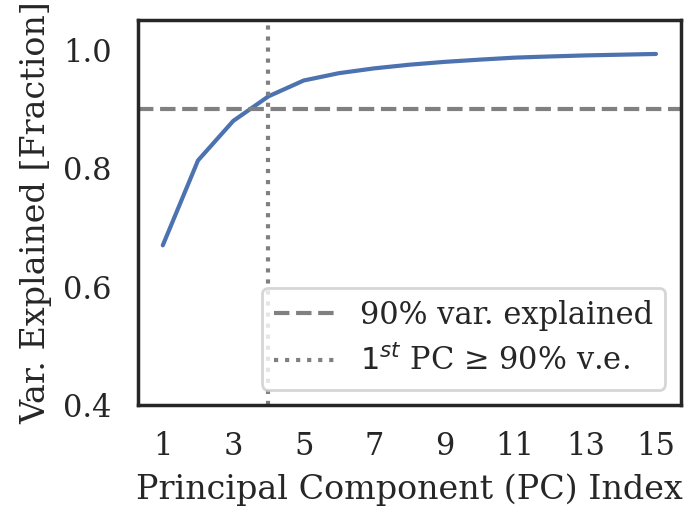

In [67]:
# def plot_scree(pca_common):
cum_evr=np.cumsum(pca_common.explained_variance_ratio_)
n_comp=len(pca_common.explained_variance_ratio_)

fig = plt.figure(figsize=(3.5,2.5))
plt.plot(cum_evr)
ax = plt.gca()
ax.set_xticks(np.arange(n_comp, step=2, dtype=int));
ax.set_xticklabels(np.arange(n_comp, step=2, dtype=int) + 1);
ax.axhline(0.90, ls='--', c='grey', label='90% var. explained')
plt.ylim(0.4, 1.05)

pc_over = np.argwhere(list(cum_evr >= 0.9))[0]
print(pc_over)
ax.axvline(pc_over, ls=':', c='grey', label='$1^{st}$ PC ≥ 90% v.e.')

plt.legend(loc='lower right')
plt.xlabel("Principal Component (PC) Index")
plt.ylabel("Var. Explained [Fraction]")

# if not batchmode:
#     plt.title(model_seed)

fname = f"{outdir}/scree_{model_seed}.png"
print("Saving:", fname)
plt.savefig(fname, dpi=dpi_save, bbox_inches='tight', transparent=True)

# plot_scree(pca_common)

In [15]:
# import umap
# pca_common = umap.UMAP(n_components=3)
# pca_common.fit(h_episodes_stacked)
# X_transformed = pca_common.fit_transform(X)
# X_transformed.shape

# import cudf
# import cuml
# pca_common = cuml.UMAP(
#     n_neighbors=15,
#     n_components=3,
#     n_epochs=500,
#     min_dist=0.1
# )
# pca_common = reducer.fit(h_episodes_stacked)

In [16]:
# # generate animations
# for idx, row in selected_df[:3].iterrows():
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#                 extended_metadata=False, squash_action=squash_action, seed=model_seed)
#     episode_idx = row['idx']
#     OUTPREFIX = 'test'
    
#     try:
#         log_analysis.animate_activity_1episode(ep_activity, 
#                 traj_df, 
#                 episode_idx, 
#                 fprefix=dataset,
#                 outprefix=OUTPREFIX,
#                 pca_dims=3,
#                 pca_common=pca_common)
#     except Exception as e:
#         print(f"Exception: {e}")

In [68]:
from pathlib import Path
import json
json_fname = f"{indir}/best_window_lengths_{model_seed}.json"
best_window_lengths = {'odor_ma': 10, 'odor_ewm': 10, 'odor_enc': 10} # defaults
if Path(json_fname).is_file():
    with open(json_fname, 'r') as fp:
        best_window_lengths = json.load(fp)
    
print(best_window_lengths)

{'odor_ma': 10, 'odor_ewm': 10, 'odor_enc': 10}


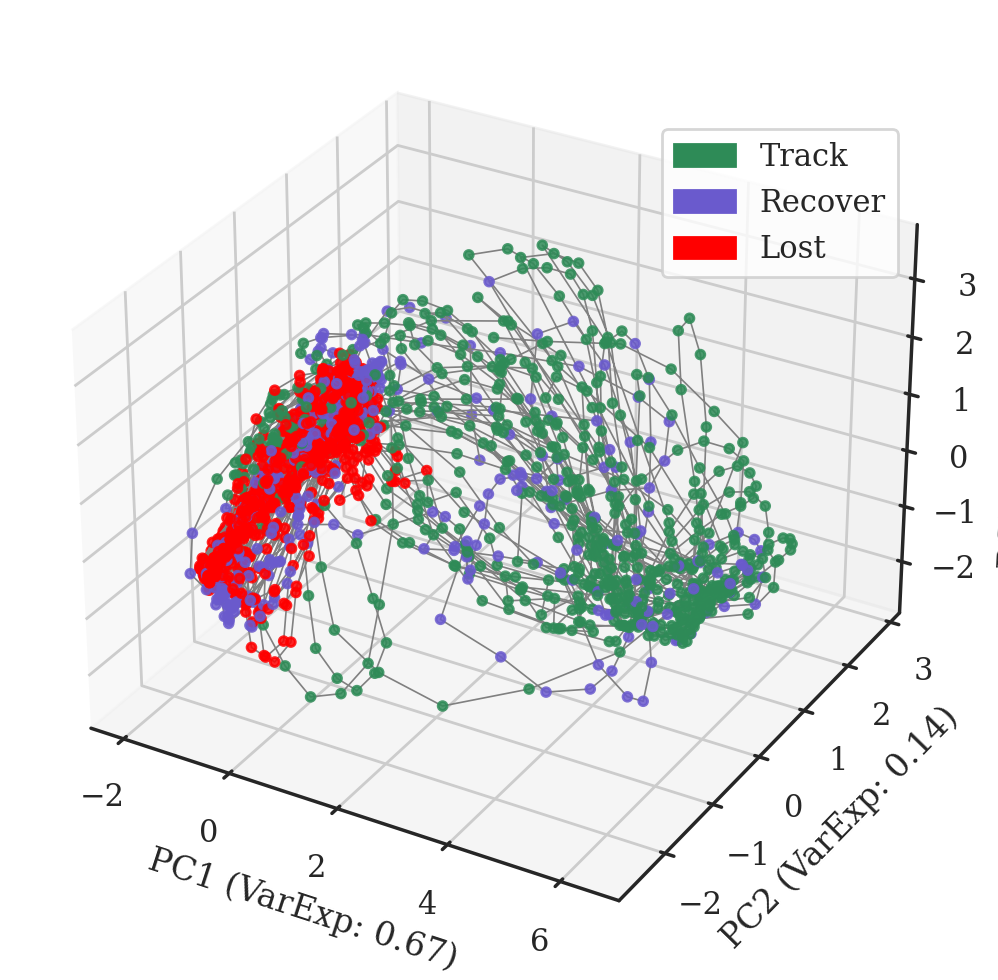

Saving: /home/mx/dbc/ext/plumetracknets_for_dbc/code/ppo/trained_models/ExptMemory20250309/plume_20250309_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed2265284//report_common_subspace//comsub_regime_2265284.png
best odor_ma_10 odor_ma
odor_ma_10 0.0 1.0
odor_ma_10 0.0 0.8330610424280167
odor_ma_10 0.0 0.0
odor_ma_10 0.0 0.8972588241100311
odor_ma_10 0.0 0.3485534407198429
odor_ma_10 0.0 1.0
odor_ma_10 0.0 0.5165314912796021
odor_ma_10 0.0 0.03227015286684036
odor_ma_10 0.0 0.02125578224658966
odor_ma_10 0.0 0.4082573540508747
odor_ma_10 0.0 0.36888511329889295
odor_ma_10 0.0 0.06500452160835266
Here1
Here2


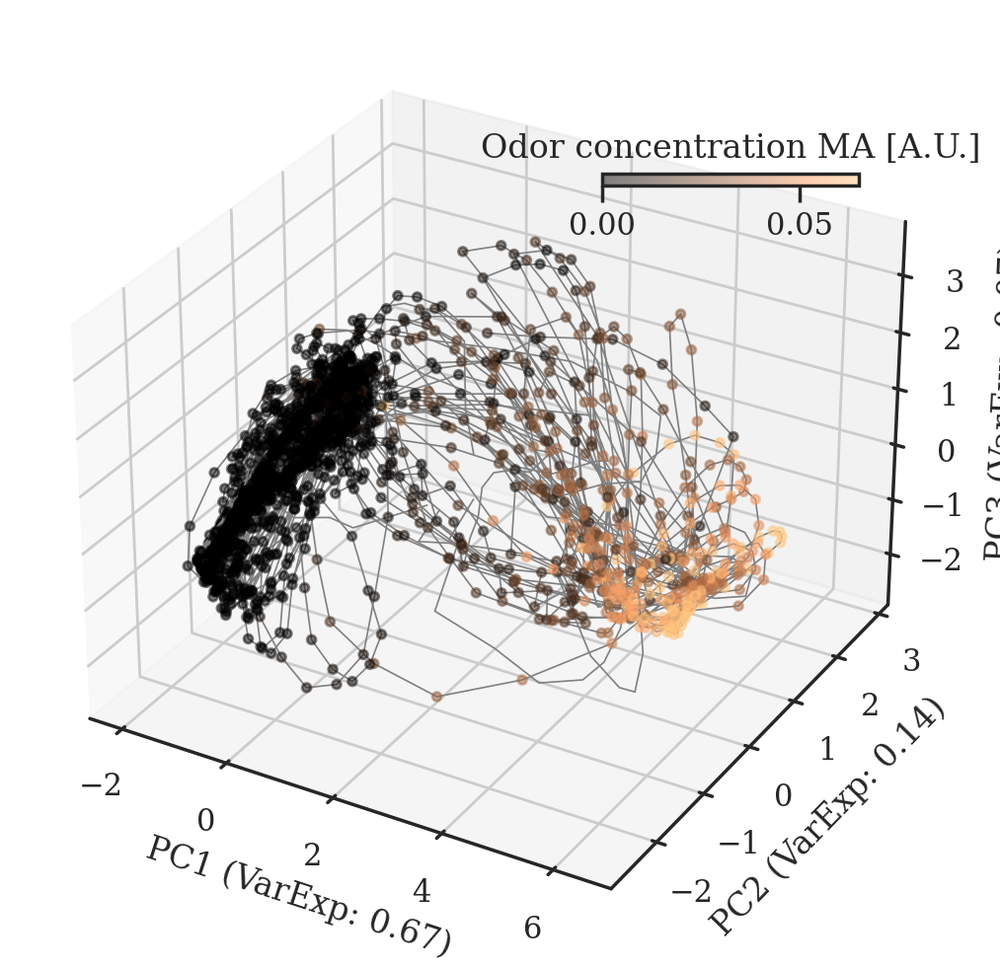

Saving: /home/mx/dbc/ext/plumetracknets_for_dbc/code/ppo/trained_models/ExptMemory20250309/plume_20250309_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed2265284//report_common_subspace//comsub_odor_ma_10_2265284.png
best odor_ewm_10 odor_ewm
odor_ewm_10 1.626228152245219e-11 1.0
odor_ewm_10 1.157545548917105e-09 0.9240660379943282
odor_ewm_10 0.0 0.0
odor_ewm_10 8.748738526139694e-13 0.9930746228219957
odor_ewm_10 0.0 0.34612650316661714
odor_ewm_10 0.036148360243716045 1.0
odor_ewm_10 0.0 0.510731610176187
odor_ewm_10 2.027237383236951e-20 0.2740783095359802
odor_ewm_10 5.3212615791361235e-21 0.07162495702505112
odor_ewm_10 2.967590015337163e-08 0.5272346225853013
odor_ewm_10 3.831627294094145e-07 0.38123447937402005
odor_ewm_10 3.124382259628175e-20 0.17809638381004333
Here1
Here2


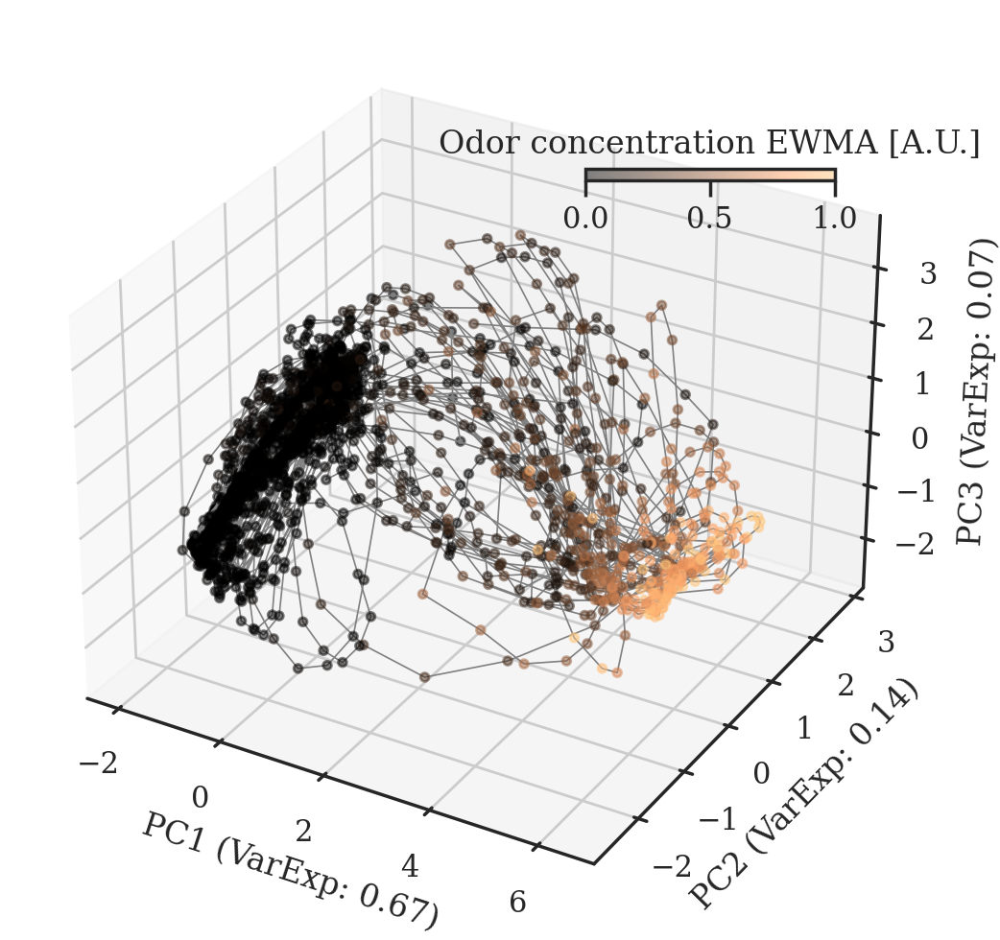

Saving: /home/mx/dbc/ext/plumetracknets_for_dbc/code/ppo/trained_models/ExptMemory20250309/plume_20250309_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed2265284//report_common_subspace//comsub_odor_ewm_10_2265284.png
best odor_enc_10 odor_enc
odor_enc_10 0.0 4.545454625109299
odor_enc_10 0.0 4.545698453260762
odor_enc_10 0.0 0.0
odor_enc_10 0.0 4.781109202906278
odor_enc_10 0.0 4.545454762705945
odor_enc_10 0.0 5.947376543870831
odor_enc_10 0.0 5.43912514332294
odor_enc_10 0.0 4.5454545454545485
odor_enc_10 0.0 4.5454545454545485
odor_enc_10 0.0 4.994954244922317
odor_enc_10 0.0 10.04983388704319
odor_enc_10 0.0 4.5454545454545485
Here1
Here2


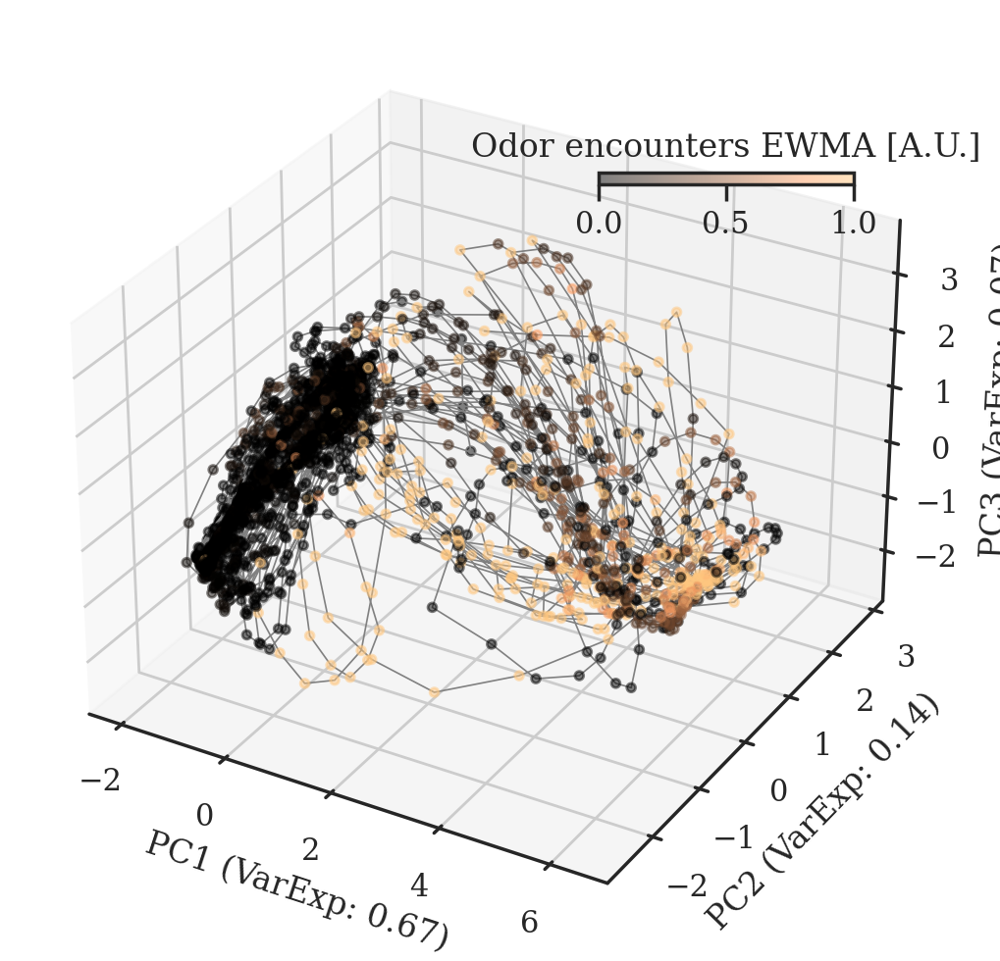

Saving: /home/mx/dbc/ext/plumetracknets_for_dbc/code/ppo/trained_models/ExptMemory20250309/plume_20250309_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed2265284//report_common_subspace//comsub_odor_enc_10_2265284.png
agent_angle_ground 0.004888616502284948 0.9995889961719516
agent_angle_ground 0.0025253109633925908 0.9986543543636801
agent_angle_ground 0.008642591536045297 0.9949626550078394
agent_angle_ground 0.004227563738822826 0.9779745936393737
agent_angle_ground 0.005334828048944751 0.9983430877327921
agent_angle_ground 0.004089381545782034 0.997576858848333
agent_angle_ground 0.009482342749834005 0.9994982369244099
agent_angle_ground 0.0009879395365715027 0.9965483546257023
agent_angle_ground 0.001154340803623477 0.9876834154129028
agent_angle_ground 0.00201781466603268 0.9998280405998233
agent_angle_ground 0.008749324828386695 0.9957884177565574
agent_angle_ground 0.0009947083890444186 0.9672286175191402
Her

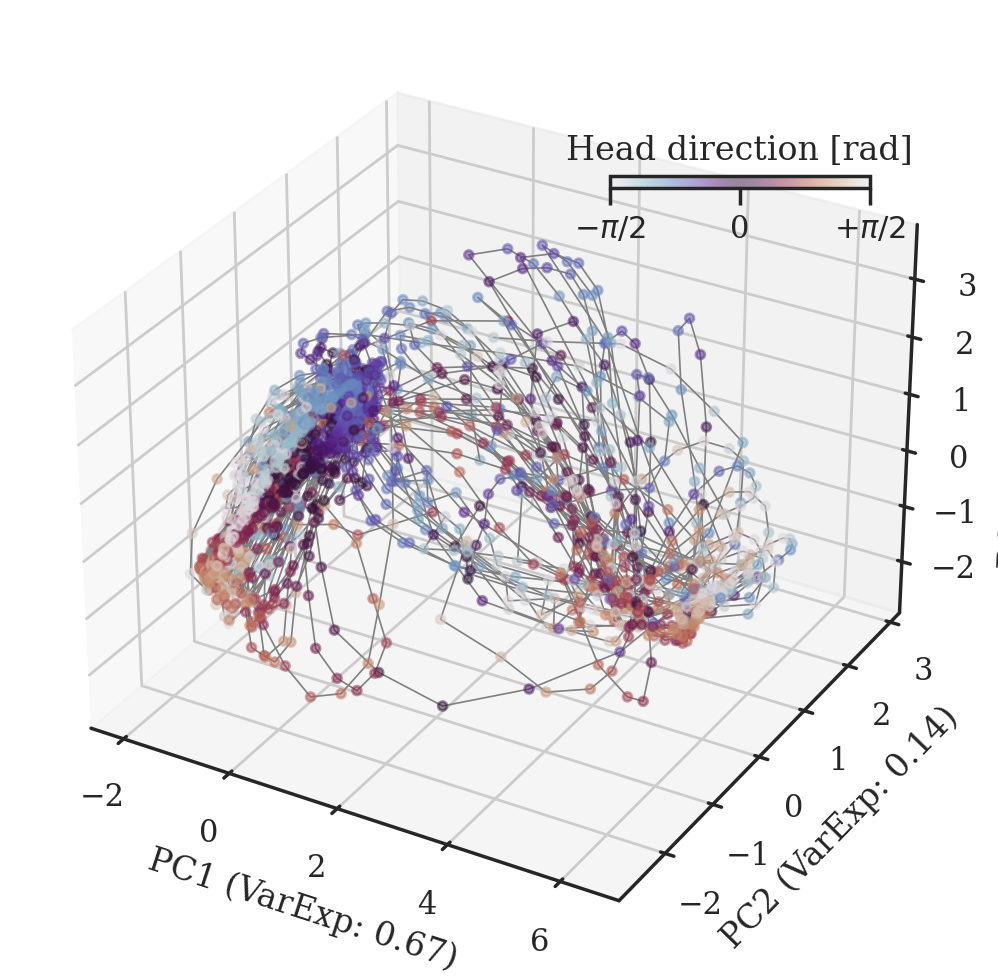

Saving: /home/mx/dbc/ext/plumetracknets_for_dbc/code/ppo/trained_models/ExptMemory20250309/plume_20250309_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed2265284//report_common_subspace//comsub_agent_angle_ground_2265284.png


In [69]:
# Plot neural-trajectories on common subspace
# %matplotlib notebook 
# importlib.reload(log_analysis)

# %config InlineBackend.figure_format = 'retina' # For manuscript
# mpl.rcParams['figure.dpi'] = 300

importlib.reload(agent_analysis)
importlib.reload(sim_analysis)
importlib.reload(log_analysis)
importlib.reload(config)


column_to_titlestring = {
    'odor_lastenc': 'Steps since last\nplume encounter',
    'stray_distance': 'stray_distance', 
    'odor_01': 'On/off plume',
    'odor_ma': 'Odor concentration MA [A.U.]',
    'odor_ewm': 'Odor concentration EWMA [A.U.]',
    'odor_enc': 'Odor encounters EWMA [A.U.]',
    'wind_theta_obs': 'Egocentric\nwind angle [rad]',
    'agent_angle_ground': r'Head direction [rad]',
    'turn': 'Turn',
    'step': 'Step',
    'neural_velocity': r"$\Delta$h",
}

column_ticklabels = {
    'agent_angle_ground': [r'$-\pi/2$', 0, r'$+\pi/2$'],
}

column_ticks = {
    'agent_angle_ground': [0, 0.5, 1.0],
}



from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def plot_common_subspace_all(selected_df, colorby):
    fig = plt.figure(figsize=pca3d_figsize)
    ax = fig.add_subplot(111, projection='3d')
    
    colorby_prefix = None
    if '_best' in colorby:
        colorby_prefix = colorby.replace('_best', '')
        window_length = best_window_lengths[colorby_prefix]
        colorby = f"{colorby_prefix}_{window_length}"
        print("best", colorby, colorby_prefix)

#     plot_df = selected_df.groupby(['dataset', 'outcome']).head(5)
    plot_df = selected_df.groupby(['dataset', 'outcome']).tail(5)
    # plot_df = selected_df.groupby(['dataset', 'outcome']).sample(5, replace=True)

    colorbar_is_plotted = False
    for idx, row in plot_df.iterrows():
        outcome = row['outcome']
        ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#         ep_activity =  pd.DataFrame(ep_activity).diff().fillna(0).to_numpy() # if colorby == 'neural_velocity' else ep_activity

        traj_df = log_analysis.get_traj_df(row['log'], 
                   extended_metadata=True, 
                   squash_action=True, 
                   n_history=100,
                   seed=model_seed)

        X_pca = pca_common.transform(ep_activity)
#         X_pca = pd.DataFrame(X_pca).diff().to_numpy()

        ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=0.6, c='grey', alpha=1.0)

        if colorby == 'outcome':
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], s=10, 
                            c=outcome_colormap[outcome], label='outcome')
            continue
        elif colorby == 'regime':    
            regime_colors = [ regime_colormap[x] for x in traj_df['regime'] ]
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], s=10, 
                            c=regime_colors, 
#                             edgecolors=None,
                            alpha=0.85)
            continue
        elif colorby in ['wind_theta_obs', 'agent_angle_ground']:  
            # Cyclic colormap: https://matplotlib.org/stable/tutorials/colors/colormaps.html
            # Seaborn: https://stackoverflow.com/questions/23712207/cyclic-colormap-without-visual-distortions-for-use-in-phase-angle-plots
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='twilight', alpha=0.5, vmin=0, vmax=1)
            continue
        elif 'odor_lastenc' in colorby:    
            vmax = 35 # fixed for odor_lastenc
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=vmax)
            continue
        elif 'odor_ma_' in colorby:    
            vmax = None
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=vmax)
            continue
        elif 'odor' in colorby:    
            vmax = 1.0
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=vmax)
            continue
        elif colorby == 'stray_distance':    
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=2)
            continue
        elif colorby in ['step', 'turn']:    
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=1)
            continue        
        elif colorby == 'neural_velocity':    
            c = pd.DataFrame(ep_activity).diff().fillna(0).apply(np.linalg.norm, axis=1)
#             c /= pd.DataFrame(ep_activity).apply(np.linalg.norm, axis=1)
#             c = np.log(1+c)
#             c = np.clip(0, 1.5, c)
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0)
            continue
        else:    
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0)

#     if not batchmode:
#         plt.title(f"{colorby} [{model_seed}]]")

    # https://stackoverflow.com/questions/18211967/position-colorbar-inside-figure
    if colorby not in ['outcome', 'regime']:
#         plt.colorbar(sc)
        cbar_ax = inset_axes(ax, 
                             width="30%", 
                             height="3%", 
#                              loc='upper right',
                             bbox_to_anchor=(0.0, 0.45, 0.92, 0.4), # (x0, y0, width, height)
                             bbox_transform=ax.transAxes,
                            )
        clb = plt.colorbar(sc, cbar_ax, orientation='horizontal') # ticks=[0., 1.]
#         cbar_ax.set_title(colorby)
        if colorby in column_to_titlestring.keys():
            cbar_ax.set_title(column_to_titlestring[colorby])
        if colorby in column_ticklabels.keys():
            clb.set_ticks(column_ticks[colorby])
            clb.set_ticklabels(column_ticklabels[colorby])

        print("Here1")
        if colorby_prefix in column_to_titlestring.keys():
            print("Here2")
            cbar_ax.set_title(column_to_titlestring[colorby_prefix])




    # https://stackoverflow.com/questions/18195758/set-matplotlib-colorbar-size-to-match-graph
    # divider = make_axes_locatable(ax)
    # cax = divider.append_axes("right", size="5%", pad=0.05)
    # plt.colorbar(sc, cax=cax)

    ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
    ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
    ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
#     plt.legend()
    plt.tight_layout()
    
    if colorby == 'regime':    
        handles, labels = plt.gca().get_legend_handles_labels()
        patch1 = mpatches.Patch(color=regime_colormap['TRACK'], label='Track')   
        patch2 = mpatches.Patch(color=regime_colormap['RECOVER'], label='Recover')   
        patch3 = mpatches.Patch(color=regime_colormap['SEARCH'], label='Lost')   
        handles.extend([patch1, patch2, patch3])
        plt.legend(handles=handles, loc='upper right', bbox_to_anchor=(0.95, 0.9))

    plt.show()
    
    fname = f"{outdir}/comsub_{colorby}_{model_seed}.png"
    print("Saving:", fname)
    fig.savefig(fname, dpi=dpi_save, bbox_inches='tight', transparent=True, format='png')

    # Just plot colorbar
#     if colorby not in ['outcome', 'regime']:
#         fig = plt.figure()
#         ax = plt.gca()
#         sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], 
#                     s=10, c=c, cmap='copper', alpha=0.5, vmin=0)
#         plt.colorbar(sc, orientation='horizontal') # ticks=[0., 1.]

#         fname = f"{outdir}/comsub_{colorby}_{model_seed}_colorbar.png"
#         print("Saving:", fname)
#         plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')


    

if batchmode:
    colorbys = [
            'outcome', 
           'regime', 
           'odor_lastenc',
           'stray_distance', 
           'odor_01', 
           'odor_ma_best',
           'odor_ewm_best',
           'odor_enc_best',
#            'odor_ma_8',
           'wind_theta_obs',
           'agent_angle_ground',
           'turn',
           'step',
           'neural_velocity']
else:
    colorbys = [
#         'outcome', 
       'regime', 
#        'odor_lastenc',
#        'stray_distance', 
#        'odor_01', 
#        'odor_ma_10',
#        'odor_ewm_10',
#        'odor_enc_50',
         'odor_ma_best',
         'odor_ewm_best',
         'odor_enc_best',
#        'wind_theta_obs',
       'agent_angle_ground',
#        'turn',
#        'step',
#        'neural_velocity'
    ]
    
for colorby in colorbys:
    plot_common_subspace_all(selected_df, colorby)



HOME [92, 81, 101, 45, 50]
OOB [30, 65, 185, 225, 0]
seed specific thresholds 12 35
Coloring 92 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


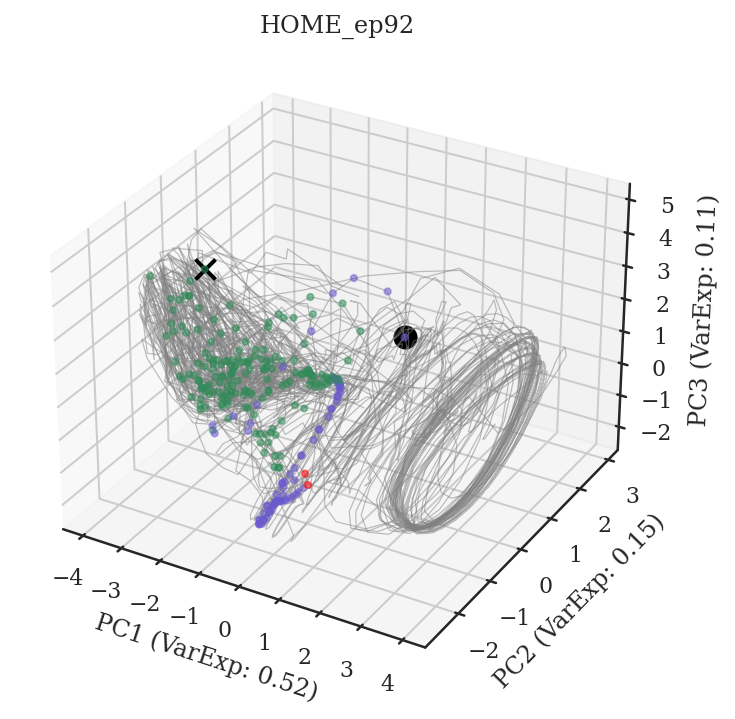

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_HOME_ep92.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

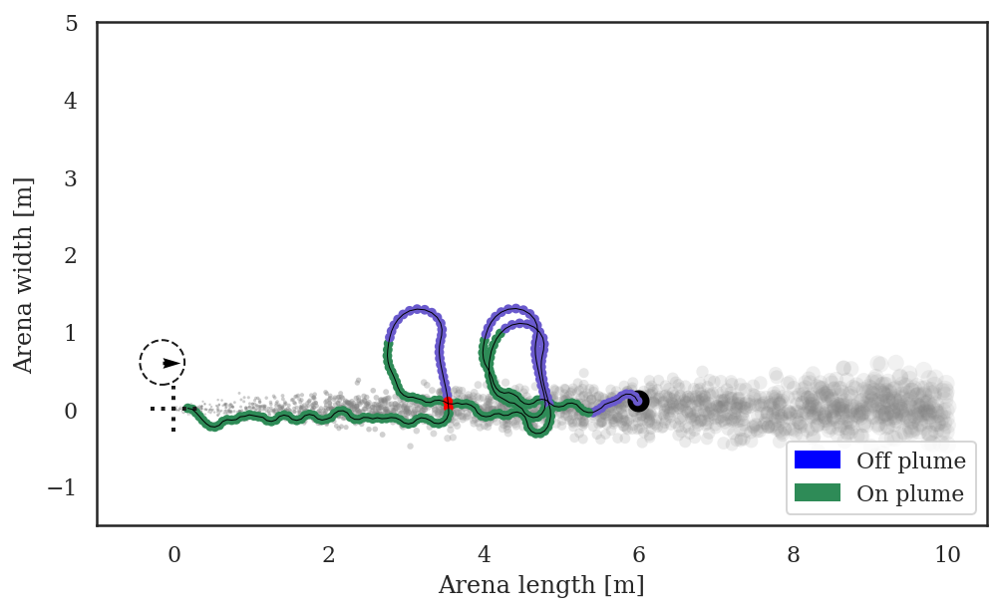

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_HOME_ep92.png
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 81 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific th

<Figure size 432x288 with 0 Axes>

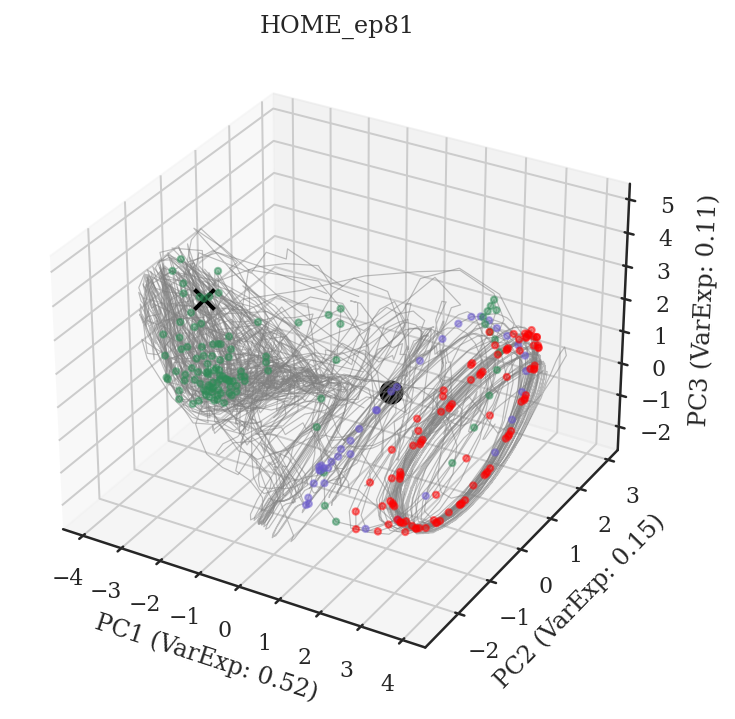

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_HOME_ep81.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

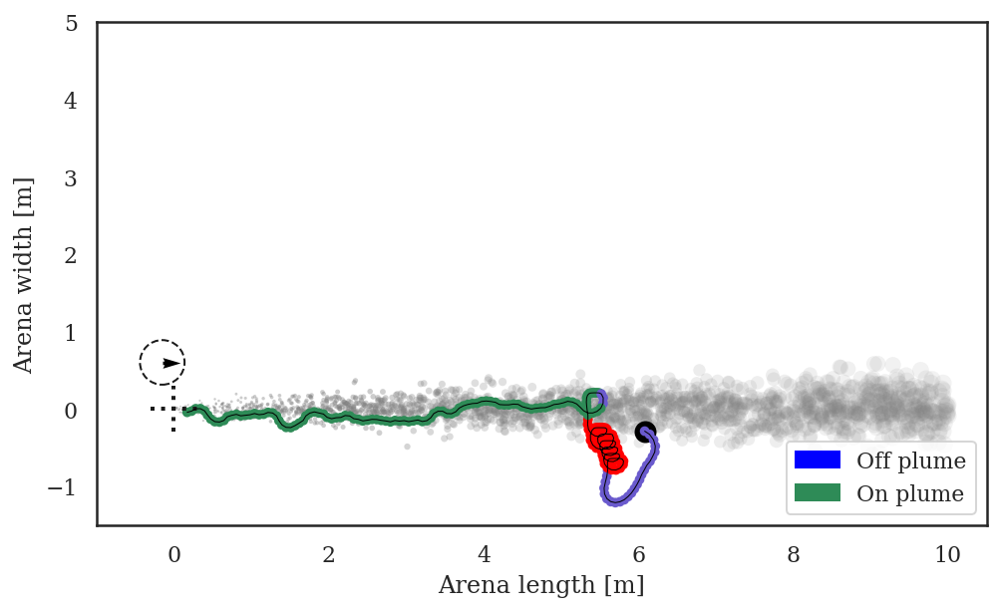

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_HOME_ep81.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 101 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific t

<Figure size 432x288 with 0 Axes>

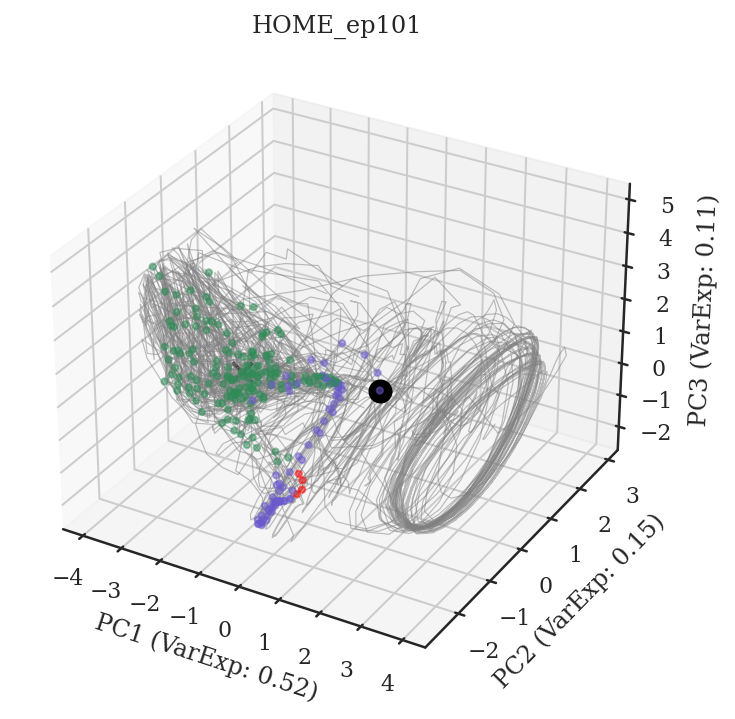

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_HOME_ep101.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

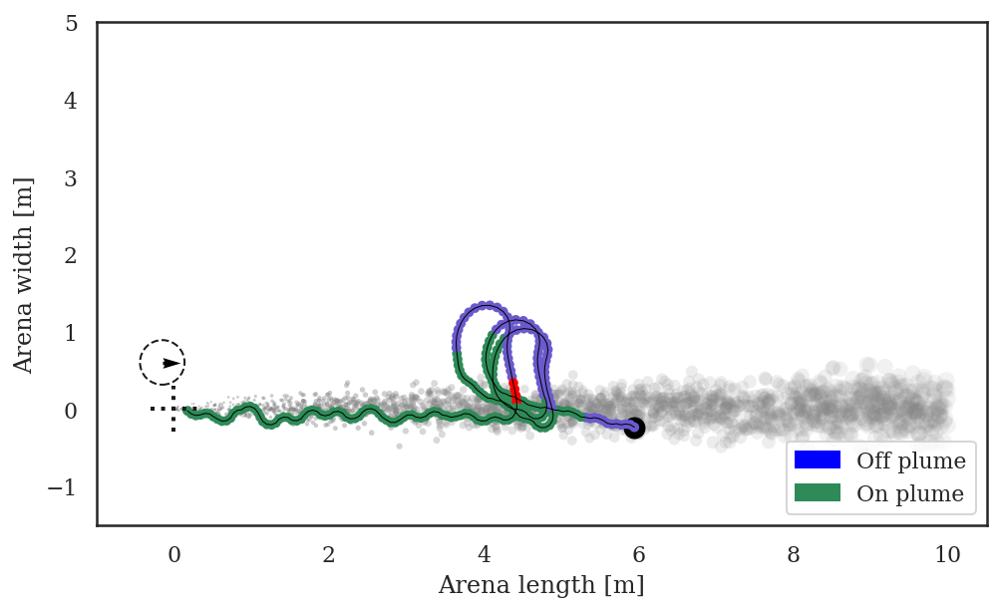

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_HOME_ep101.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 45 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific t

<Figure size 432x288 with 0 Axes>

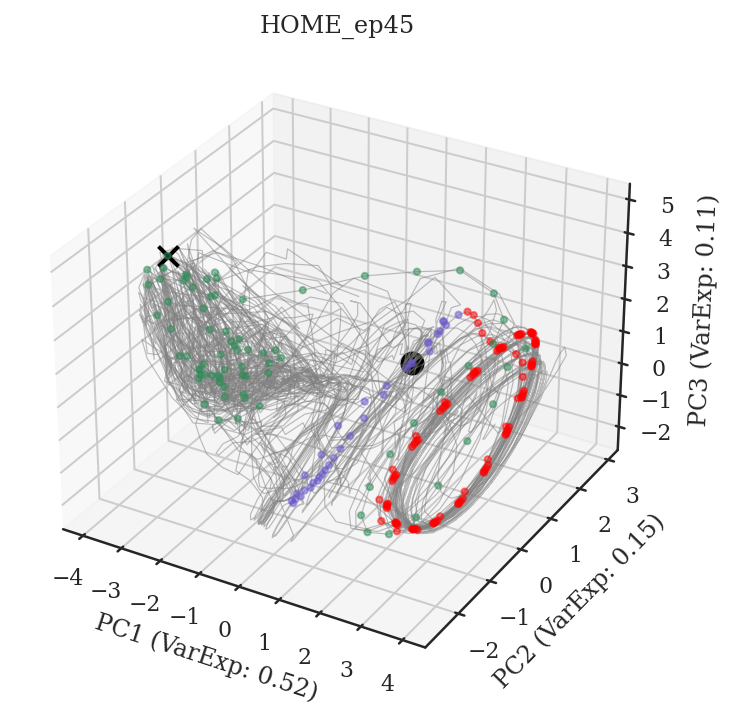

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_HOME_ep45.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

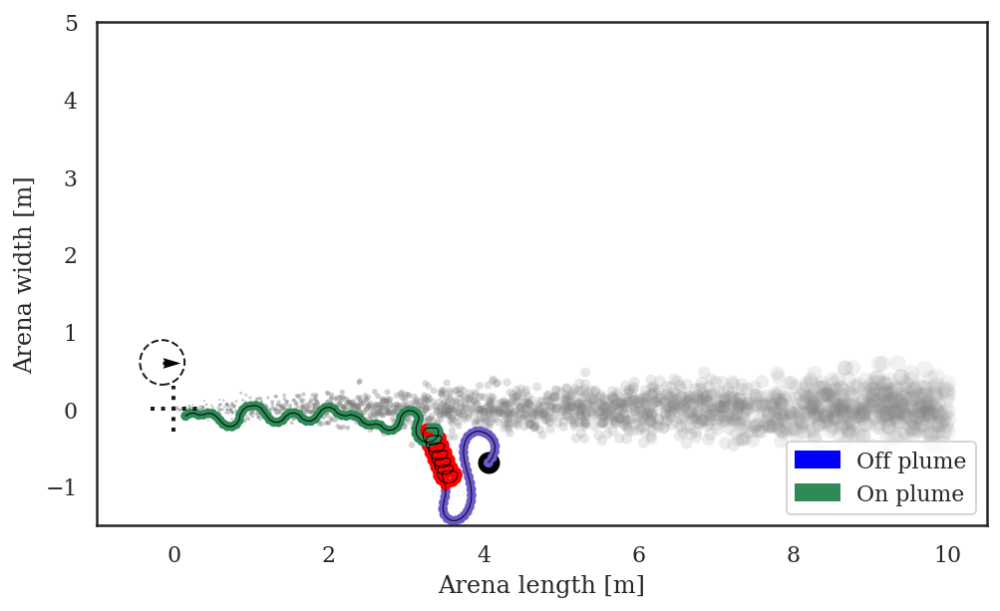

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_HOME_ep45.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 50 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific th

<Figure size 432x288 with 0 Axes>

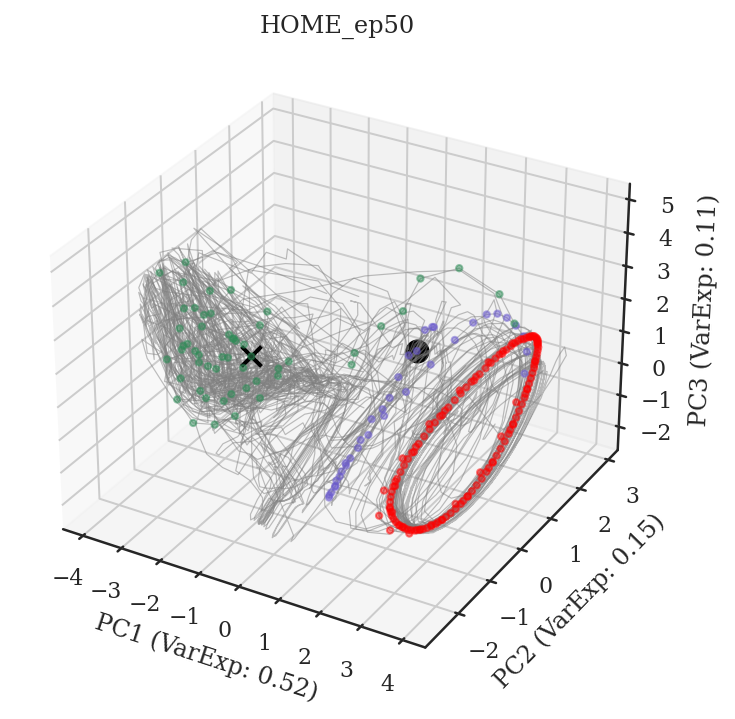

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_HOME_ep50.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

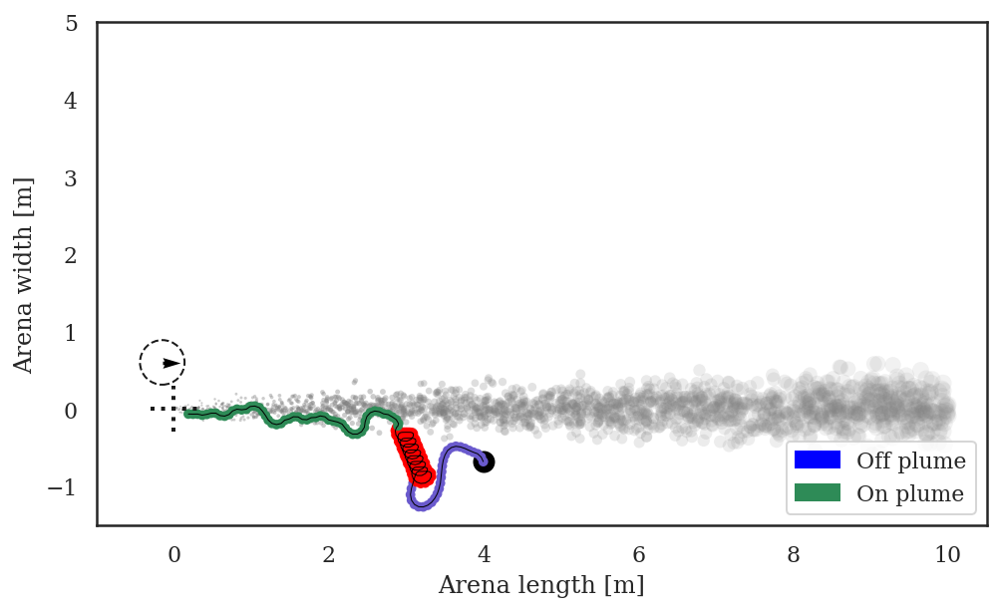

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_HOME_ep50.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 30 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thr

<Figure size 432x288 with 0 Axes>

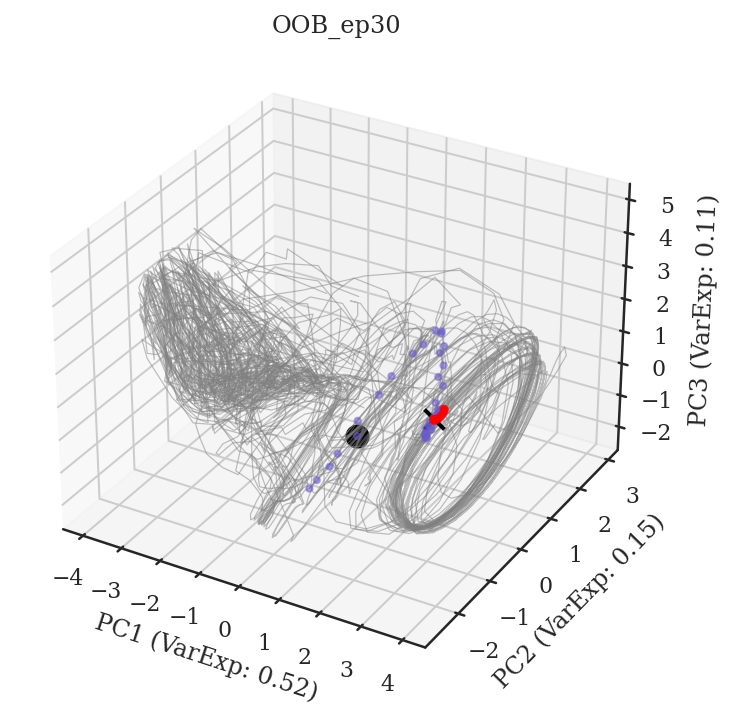

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_OOB_ep30.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

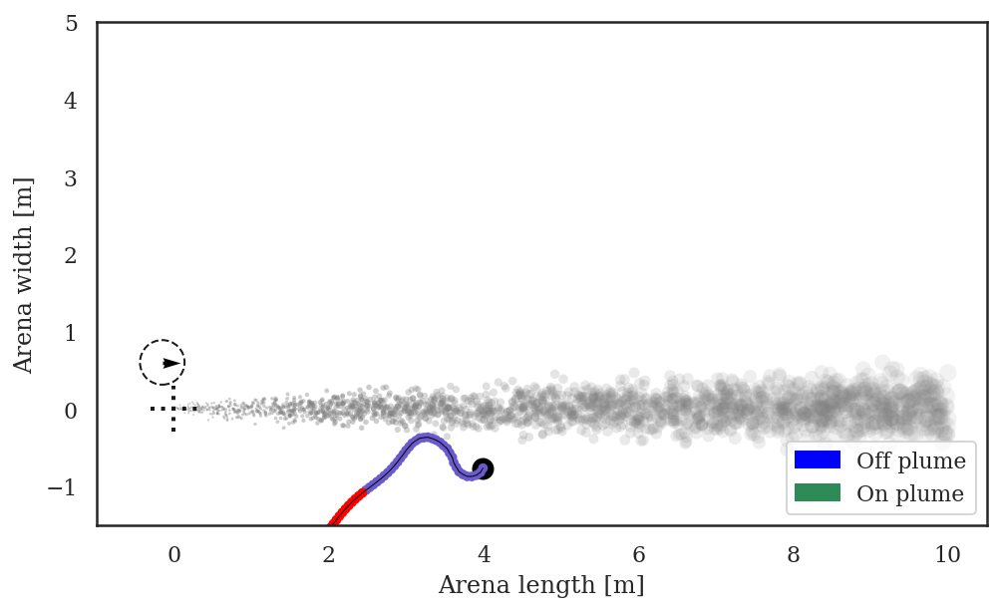

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_OOB_ep30.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 65 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thre

<Figure size 432x288 with 0 Axes>

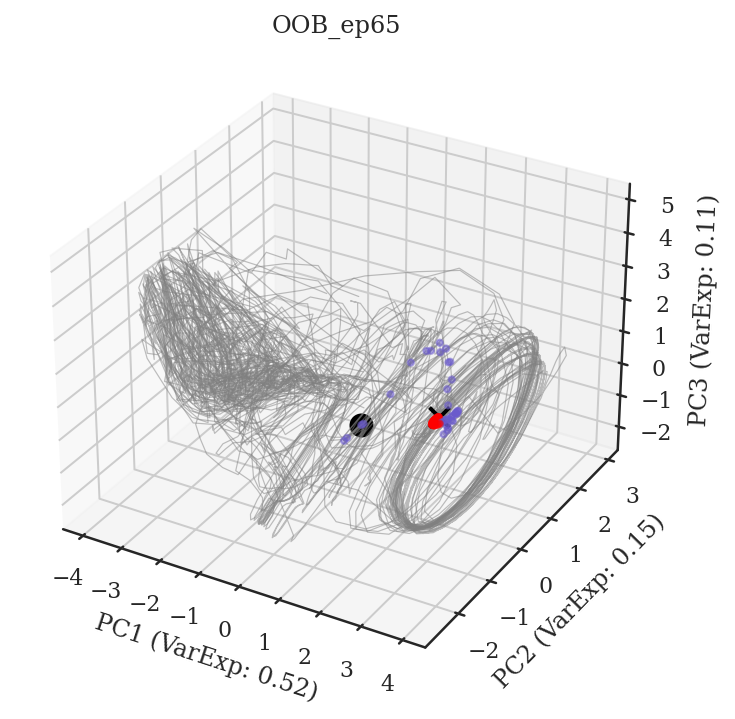

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_OOB_ep65.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

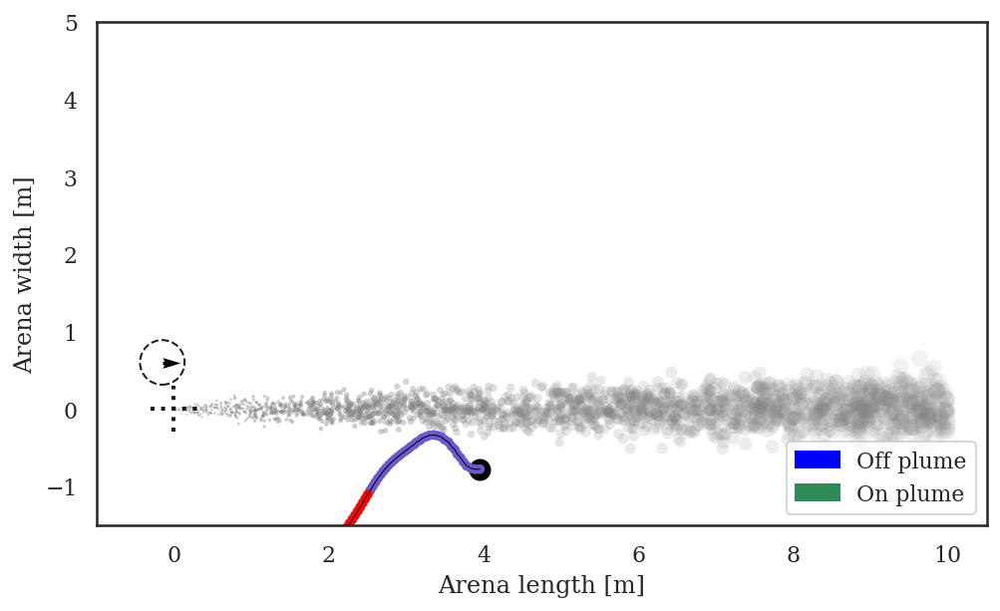

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_OOB_ep65.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 185 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thr

<Figure size 432x288 with 0 Axes>

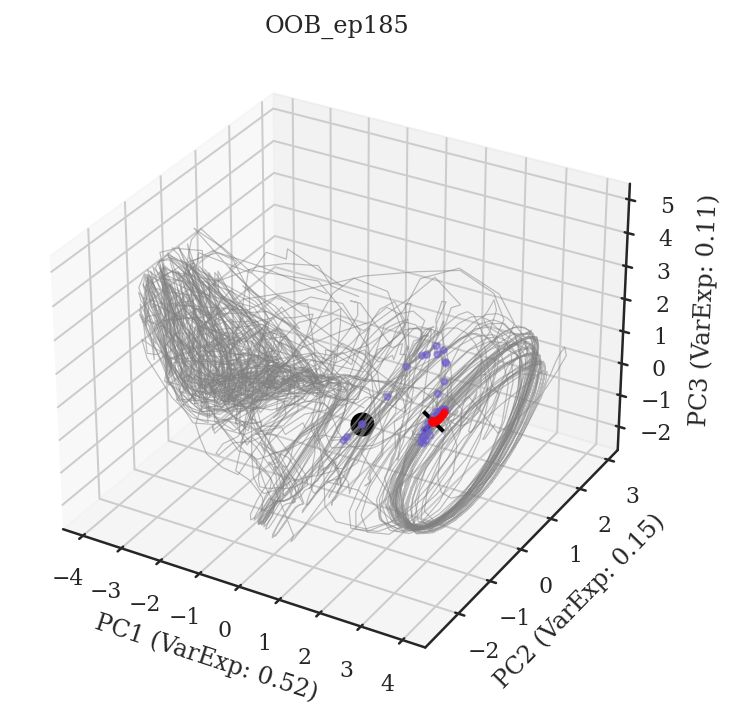

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_OOB_ep185.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

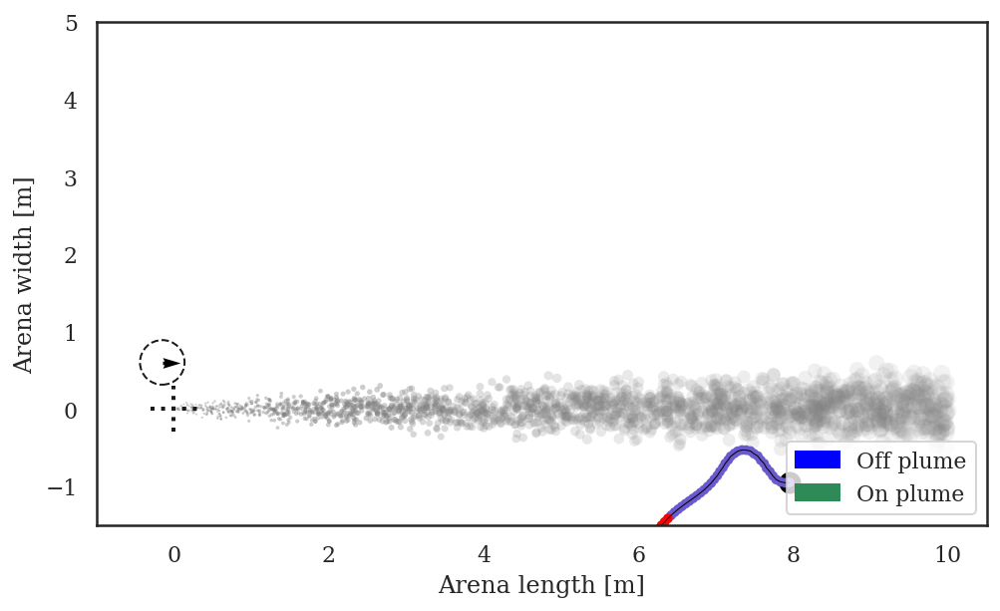

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_OOB_ep185.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 225 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific th

<Figure size 432x288 with 0 Axes>

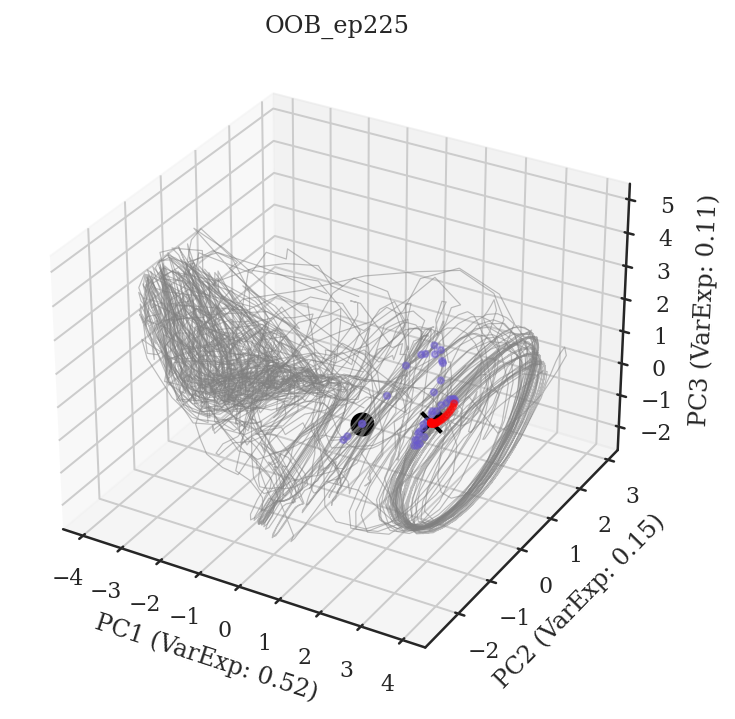

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_OOB_ep225.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

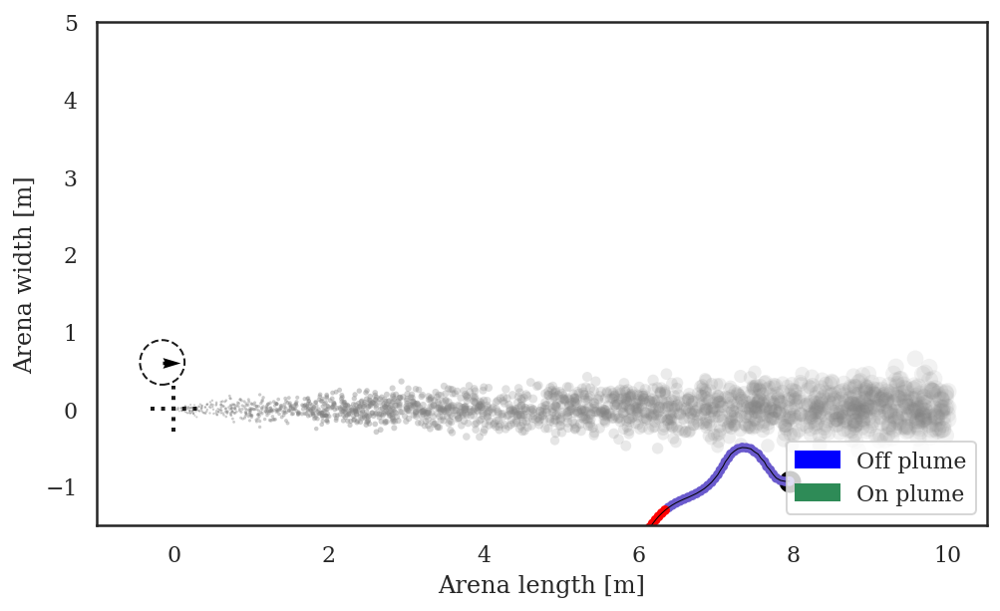

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_OOB_ep225.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 0 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thre

<Figure size 432x288 with 0 Axes>

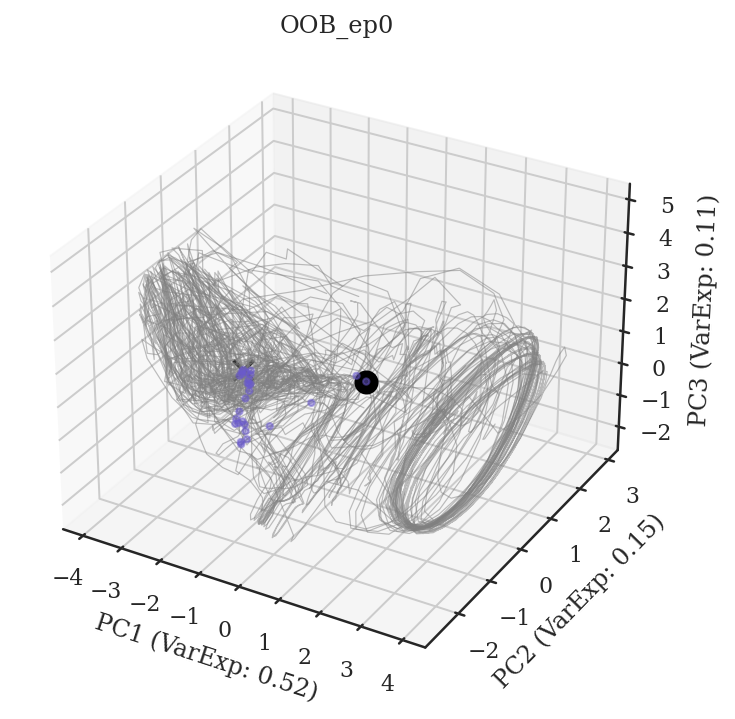

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_neural_3307e9_OOB_ep0.png
seed specific thresholds 12 35
constantx5b5
Applying diffusion_multiplier 0.5


<Figure size 432x288 with 0 Axes>

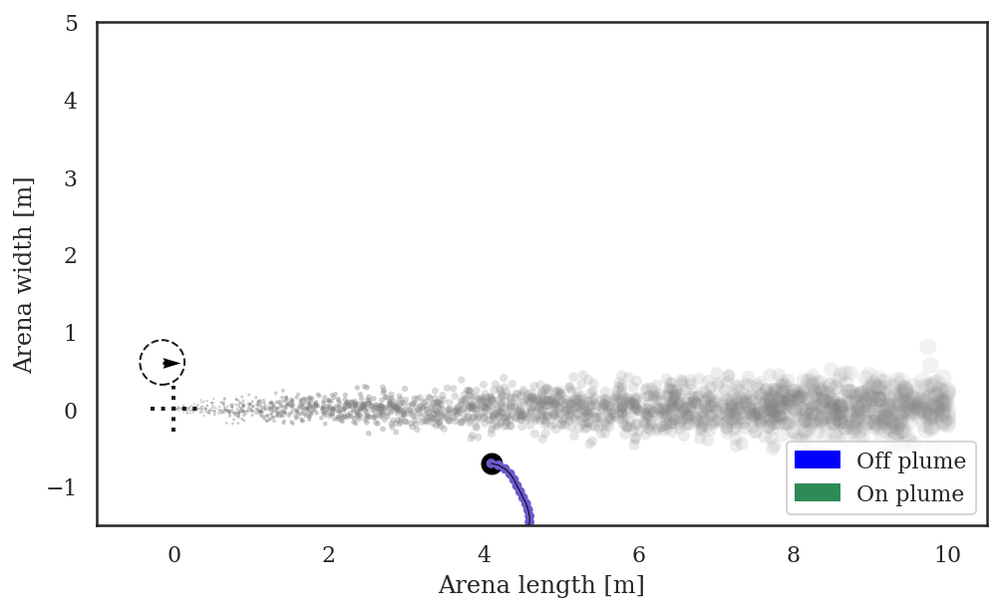

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//regime_traj_3307e9_OOB_ep0.png


<Figure size 432x288 with 0 Axes>

In [19]:
# Plot neural-trajectories on common subspace
# %matplotlib notebook 
# importlib.reload(log_analysis)

def plot_common_subspace_individual(selected_df, plot_df, idxs_to_color, viz_dataset):
    for outcome in ['HOME', 'OOB']:        
        for idx2color in idxs_to_color[outcome]:
            fig = plt.figure(figsize=pca3d_figsize)
            ax = fig.gca(projection='3d')

            for idx, row in plot_df.iterrows():
#                 outcome = row['outcome']
                ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
                traj_df = log_analysis.get_traj_df(row['log'], 
                        extended_metadata=False, 
                        squash_action=False,
                        seed=model_seed)

                X_pca = pca_common.transform(ep_activity)
                ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=0.6, c='grey', alpha=0.5)

                # Color trajectory timestep by REGIME
                if row['dataset'] == viz_dataset and row['idx'] == idx2color:
                    viz_log = row['log']
                    print('Coloring', row['idx'], outcome)
                    regime_colors = [ regime_colormap[x] for x in traj_df['regime'] ]
                    sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], s=10, c=regime_colors, alpha=0.5)
                    ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], c='black', marker='o', lw=2, s=100) # Start
                    ax.scatter(X_pca[-1, 0], X_pca[-1, 1], X_pca[-1, 2], c='black', marker='x', lw=2, s=100) # End

        #     print(idx, row['idx'])
            ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
            ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
            ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
            plt.title(f"{outcome}_ep{idx2color}")
            plt.tight_layout()
            plt.show()
            fname = f"{outdir}/regime_neural_{model_seed}_{outcome}_ep{idx2color}.png"
            print("Saving:", fname)
            plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')

            # Plot associated trajectory
            traj_df = log_analysis.get_traj_df(viz_log, 
                    extended_metadata=False, 
                    squash_action=True,
                    seed=model_seed)
            regime_colorby = log_analysis.regime_to_colors( traj_df['regime'].to_list() )
            agent_analysis.visualize_episodes([viz_log], 
                                          zoom=2, 
                                          dataset=viz_dataset,
                                          animate=False,
                                          colorby=regime_colorby,
                                          diffusionx=diffusionx,
                                         )
            plt.xlim(-1, 10.5)
            plt.show()
            title = f"{outcome}_ep{idx2color}"
            fname = f"{outdir}/regime_traj_{model_seed}_{title}.png"
            print("Saving:", fname)
            plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')

            
viz_dataset = 'constantx5b5'
# viz_dataset = 'switch45x5b5'
# viz_dataset = 'noisy6x5b5'
# viz_dataset = 'noisy3x5b5'

n_background = 5
n_color = 5
plot_df = selected_df.groupby(['dataset', 'outcome']).tail(n_background)
idxs_to_color = {}
for outcome in plot_df['outcome'].unique():
    idxs_to_color[outcome] = plot_df.query("dataset == @viz_dataset and outcome == @outcome").head(n_color)['idx'].to_list()
    print(outcome, idxs_to_color[outcome])
    
plot_common_subspace_individual(selected_df, plot_df, idxs_to_color, viz_dataset)

In [20]:
# # importlib.reload(agent_analysis)
# # importlib.reload(log_analysis)

# def plot_common_subspace_individual_traj(plot_df, idxs_to_color):
#     for outcome in ['HOME', 'OOB']:
#         for idx, row in plot_df.iterrows():
#             if row['dataset'] == viz_dataset and row['idx'] in idxs_to_color[outcome]:
#                 outcome = row['outcome']
#                 ep_activity = log_analysis.get_activity(row['log'], 
#                                                         is_recurrent, 
#                                                         do_plot=False)
#                 traj_df = log_analysis.get_traj_df(row['log'], 
#                     extended_metadata=False, squash_action=False, seed=model_seed)

#                 print('Coloring', row['idx'], outcome, row['dataset'])
                
#                 title = f"{outcome}_ep{row['idx']}"
#                 agent_analysis.visualize_episodes([row['log']], 
#                                           zoom=2, 
#                                           dataset=row['dataset'],
#                                           animate=False,
# #                                           title=title, # not supported
#                                           colorby='regime',
#                                             diffusionx=diffusionx,
#                                          )
#                 plt.xlim(-1, 10.5)
#                 plt.show()
#                 fname = f"{outdir}/traj_regime_{title}.png"
#                 print("Saving:", fname)
#                 plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')

# plot_common_subspace_individual_traj(plot_df, idxs_to_color)

## Time to surge/time to cast analysis

### Extract centroids of [HOME] and [OOB] from actual trials

In [21]:
trail_len = 25
h_outcomes = ['HOME', 'OOB']
hx_centroids = {}
for h_outcome in h_outcomes: 
    hx_trailing = [] # hidden activity around end of trial
    #     for log in plot_df.query("outcome == @h_outcome")['log']:
    for log in selected_df.query("outcome == @h_outcome")['log']:
        ep_activity = log_analysis.get_activity(log, 
                                            is_recurrent, 
                                            do_plot=False)
#         print(h_outcome, ep_activity.shape[0])
        if h_outcome == 'HOME':
            hx_trailing.append( ep_activity[-trail_len:,:] )
        if h_outcome == 'OOB' and ep_activity.shape[0] > 75: # Use longer (>3s) traj for OOB
            hx_trailing.append( ep_activity[-trail_len:,:] )
    hx_trailing = np.vstack(hx_trailing)
    # hx_trailing.shape
#     hx_centroids[h_outcome] = np.median(hx_trailing, axis=0).reshape((1, -1))
    hx_centroids[h_outcome] = np.mean(hx_trailing, axis=0).reshape((1, -1))
    
dist_between_centroids = np.linalg.norm(hx_centroids[h_outcomes[0]] - hx_centroids[h_outcomes[1]])
dist_between_centroids

5.9670706

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


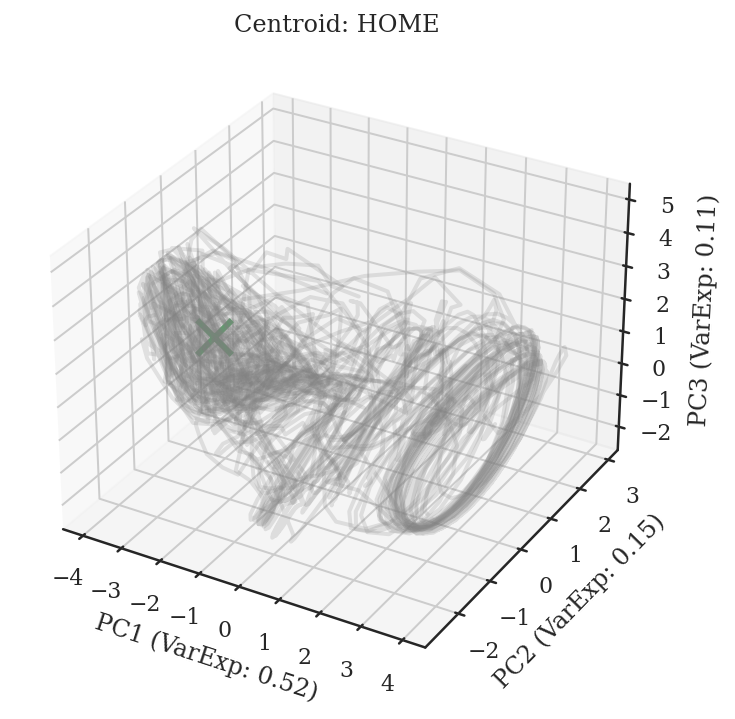

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//centroids_3307e9_HOME.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed spec

<Figure size 432x288 with 0 Axes>

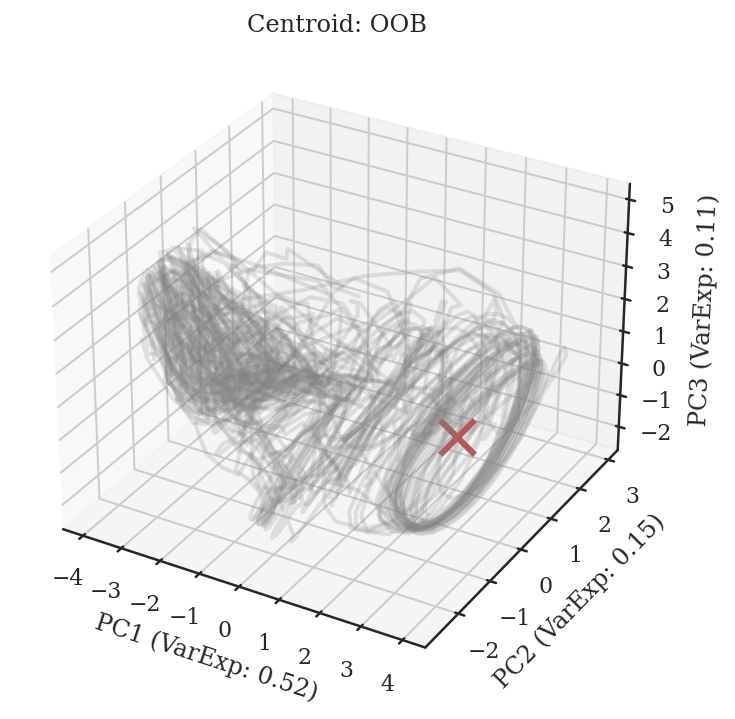

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//centroids_3307e9_OOB.png


<Figure size 432x288 with 0 Axes>

In [22]:
# Plot extracted centroids
n_background = 5
n_color = 1
plot_df = selected_df.groupby(['dataset', 'outcome']).tail(n_background)

for h_outcome in h_outcomes: 
    fig = plt.figure(figsize=pca3d_figsize)
    ax = fig.gca(projection='3d')

    for idx, row in plot_df.iterrows():
        outcome = row['outcome']
        ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
        traj_df = log_analysis.get_traj_df(row['log'], 
                extended_metadata=False, squash_action=False, seed=model_seed)

        X_pca = pca_common.transform(ep_activity)
        ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=2, c='grey', alpha=0.2)

    # plot the centroid
    X_pca = pca_common.transform(hx_centroids[h_outcome])
    ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], 
       c=outcome_colormap[h_outcome], marker='x', linewidth=3.0, s=300, alpha=1.0) 
    
    ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
    ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
    ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
    plt.title(f"Centroid: {h_outcome}")
    plt.tight_layout()
    plt.show()

    fname = f"{outdir}/centroids_{model_seed}_{h_outcome}.png"
    print("Saving:", fname)
    plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')

In [23]:
outcome_colormap.values()

dict_values(['g', 'r', 'b'])

### Color by which centroid closer to [2-centroid model]

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


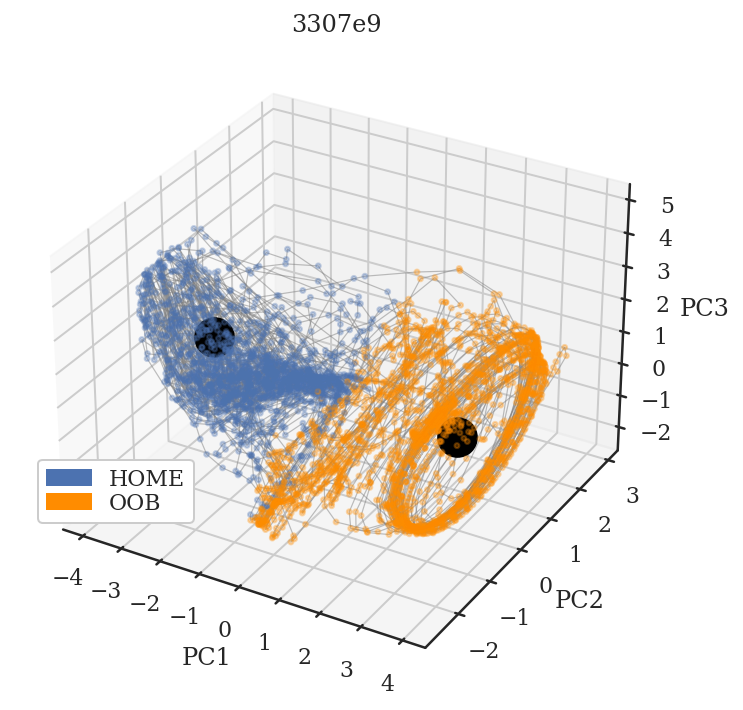

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_by_centroid_3307e9.png


<Figure size 432x288 with 0 Axes>

In [24]:
# %config InlineBackend.figure_format = 'retina'
# mpl.rcParams['figure.dpi'] = 300


n_background = 5
n_color = 1
plot_df = selected_df.groupby(['dataset', 'outcome']).tail(n_background)

fig = plt.figure(figsize=pca3d_figsize)
# fig = plt.figure(figsize=(4,7))
ax = fig.gca(projection='3d')

# outcome_colormap['HOME'] = 'lightblue'
# outcome_colormap['HOME'] = 'b'
importlib.reload(config)
ttcs_colormap = config.ttcs_colormap

# Doesn't respect this!
# https://matplotlib.org/3.3.3/gallery/misc/zorder_demo.html
    
# # plot centroids
# for h_outcome in hx_centroids.keys():
#     X_pca = pca_common.transform(hx_centroids[h_outcome])
#     ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], alpha=1.0, 
#        c='black', marker='x', lw=3, s=300, zorder=10) 

    
for idx, row in plot_df.iterrows():
    outcome = row['outcome']
    ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
    traj_df = log_analysis.get_traj_df(row['log'], 
            extended_metadata=False, squash_action=False, seed=model_seed)

    X_pca = pca_common.transform(ep_activity)
    ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
            linewidth=0.6, c='grey', alpha=0.5, zorder=1)

    # Add scatterplot colored by distance to centroids
    colors = pd.Series(['grey']*X_pca.shape[0])
    dist_home = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
    dist_oob = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)
#     colors = pd.Series(outcome_colormap.values())[ dist_home < dist_oob ]
    closer_to_home = [ dist_home[i] < dist_oob[i] for i in range(dist_home.shape[0]) ] 
    colors = [ ttcs_colormap['HOME'] if x else ttcs_colormap['OOB'] for x in closer_to_home ]
#     for h_outcome in hx_centroids.keys():
#         distances = np.linalg.norm(ep_activity - hx_centroids[h_outcome], axis=1)
#         in_range_idxs = distances <= centroid_ranges[h_outcome]
#         colors[ in_range_idxs ] = outcome_colormap[h_outcome]
    ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
               c=colors, alpha=0.3, s=6, zorder=1)

# plot centroids
for h_outcome in hx_centroids.keys():
    X_pca = pca_common.transform(hx_centroids[h_outcome])
    ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], alpha=1.0, 
       c='black', marker='o', lw=3, s=300, zorder=10) 

# legend
handles, labels = plt.gca().get_legend_handles_labels()
patch1 = mpatches.Patch(color=ttcs_colormap['HOME'], label='HOME')   
patch2 = mpatches.Patch(color=ttcs_colormap['OOB'], label='OOB')   
handles.extend([patch1, patch2])
plt.legend(handles=handles, 
           loc='lower left', 
           framealpha=1.0,
           labelspacing=0.07,
           bbox_to_anchor=(0.02, 0.24),
          )

ax.set_xlabel(f'PC1')
ax.set_ylabel(f'PC2')
ax.set_zlabel(f'PC3')

# ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
# ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
# ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
if not batchmode:
    plt.title(f"{model_seed}")
plt.tight_layout()
plt.show()

fname = f"{outdir}/comsub_by_centroid_{model_seed}.png"
print("Saving:", fname)
plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')

In [25]:
# # Color if within range from centroid
# n_background = 5
# n_color = 1
# plot_df = selected_df.groupby(['dataset', 'outcome']).tail(n_background)

# # centroid_ranges = {'HOME':4.0, 'OOB':4.0}
# centroid_ranges = {'HOME':dist_between_centroids/2, 'OOB':dist_between_centroids/2}

# fig = plt.figure(figsize=pca3d_figsize)
# ax = fig.gca(projection='3d')

# for h_outcome in hx_centroids.keys():
#     # plot the centroid
#     X_pca = pca_common.transform(hx_centroids[h_outcome])
#     ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], alpha=1.0, 
#        c=outcome_colormap[h_outcome], marker='x', s=100) 

# for idx, row in plot_df.iterrows():
#     outcome = row['outcome']
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#             extended_metadata=False, squash_action=False, seed=model_seed)

#     X_pca = pca_common.transform(ep_activity)
#     ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=0.6, c='grey', alpha=0.5)

#     # Add scatterplot colored by distance to centroids
#     colors = pd.Series(['grey']*X_pca.shape[0])
#     for h_outcome in hx_centroids.keys():
#         distances = np.linalg.norm(ep_activity - hx_centroids[h_outcome], axis=1)
#         in_range_idxs = distances <= centroid_ranges[h_outcome]
#         colors[ in_range_idxs ] = outcome_colormap[h_outcome]
#     ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
#                c=colors, alpha=0.3, s=4)



# ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
# ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
# ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
# plt.title(f"Centroid: {h_outcome}")
# plt.tight_layout()
# plt.show()

# fname = f"{outdir}/centroids_by_dist_{model_seed}_{h_outcome}.png"
# print("Saving:", fname)
# plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')


## Floris Q: Time to cast vs time to surge

### Time to cast

In [26]:
# Find episodes that end in casting (OOB)
# Find time from last_enc=0 to entry into OOB-centroid-range
# However, should have encountered plume at least once i.e. last_enc=0 for multiple rows

# for idx, row in plot_df.query("outcome == 'OOB' and dataset == 'constantx5b5' ").iterrows():
#     outcome = row['outcome']
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#             extended_metadata=False, squash_action=False, seed=model_seed)
#     if sum(traj_df.odor_lastenc == 0) > 1: # encountered plume at least once
#         print("Found")
#         break

In [27]:
# # centroid_ranges = {'HOME':dist_between_centroids/3, 'OOB':dist_between_centroids/3}
# centroid_ranges = {'HOME':dist_between_centroids/2, 'OOB':dist_between_centroids/2}


# home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
# oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)
# oob_distances

# # TODO fix -- Hack to get plot scales same
# max_val = np.max( [np.max(home_distances), np.max(oob_distances)] )
# max_val
# # np.max(home_distances)

# min_val = np.min( [np.min(home_distances), np.min(oob_distances)] )
# print(min_val, max_val)
# # 
# # pd.Series(home_distances).describe(), pd.Series(oob_distances).describe()

# pd.Series(home_distances).hist(alpha=0.5) # Blue
# pd.Series(oob_distances).hist(alpha=0.5) # Orange
# plt.show()

# exit_idx = len(traj_df.odor_01) - pd.Series(traj_df.odor_01).iloc[::-1].argmax()
# print(exit_idx)

# pd.Series(home_distances).plot(figsize=(5, 1.5), label=r'd$_{HOME}$') # Blue
# pd.Series(oob_distances).plot(label=r'd$_{OOB}$') # Orange
# for x in ['HOME', 'OOB']:
#     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.legend()
# plt.show()

# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1))
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

# agent_analysis.visualize_episodes([row['log']], 
#           zoom=2, 
#           dataset=row['dataset'],
#           animate=False,
#          )
# plt.show()

# for x in ['HOME', 'OOB']:
#     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.legend()
# plt.show()

# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1))
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

# agent_analysis.visualize_episodes([row['log']], 
#     zoom=2, 
#     dataset=row['dataset'],
#     animate=False,
#     )
# plt.show()

In [28]:
# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# exit_idx = len(traj_df.odor_01) - pd.Series(traj_df.odor_01).iloc[::-1].argmax()
# print(exit_idx)
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

In [29]:
# # Distances in PCA space? -- Basically the same

# ep_pca = pca_common.transform(ep_activity)
# hx_centroids_pca = {}
# for h_outcome in hx_centroids.keys():
#     hx_centroids_pca[h_outcome] = pca_common.transform(hx_centroids[h_outcome])

# home_distances = np.linalg.norm(ep_pca - hx_centroids_pca['HOME'], axis=1)
# oob_distances = np.linalg.norm(ep_pca - hx_centroids_pca['OOB'], axis=1)

# # TODO fix -- Hack to get scales same
# max_val = np.max( [np.max(home_distances), np.max(oob_distances)] )
# min_val = np.min( [np.min(home_distances), np.min(oob_distances)] )
# print(min_val, max_val)

# pd.Series(home_distances).hist(alpha=0.5) # Blue
# pd.Series(oob_distances).hist(alpha=0.5) # Orange
# plt.show()

# pd.Series(home_distances).plot(figsize=(5, 1.5))
# pd.Series(oob_distances).plot() # Orange

In [30]:
# # traj_df.loc[:, ['loc_x', 'loc_y']]
# # plt.plot(traj_df['loc_x'], traj_df['loc_y'])
# agent_analysis.visualize_episodes([row['log']], 
#                           zoom=2, 
#                           dataset=row['dataset'],
#                           animate=False,
#                           colorby=home_distances,
#                           vmax=max_val,
#                          )

# agent_analysis.visualize_episodes([row['log']], 
#                           zoom=2, 
#                           dataset=row['dataset'],
#                           animate=False,
#                           colorby=oob_distances,
#                           vmax=max_val,
#                          )

### Time to surge

In [31]:
# # Find episodes that end in HOME
# # Do a hist. of last_enc_max
# # If bimodal, choose episodes with longer duration mode; 
# #   else arbitrary threshold
# # Find trajectory snippets from last_enc.diff()<0, to 15(?) timesteps...
# # .... and look for entry into the HOME-centroid-range

# last_encs = []
# # for idx, row in selected_df.query("outcome == 'HOME' and dataset == 'constantx5b5' ").iterrows():
# for idx, row in plot_df.query("outcome == 'HOME' and dataset == 'constantx5b5' ").iterrows():
#     outcome = row['outcome']
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#             extended_metadata=False, squash_action=False, seed=model_seed)
# #     last_encs.extend( traj_df.odor_lastenc.to_list() )
#     last_encs.append( traj_df.odor_lastenc.max() )
# pd.Series(last_encs).hist() # Not bimodal for plot_df, but is for selected_df

In [32]:
# last_encs = []
# # for idx, row in selected_df.query("outcome == 'HOME' and dataset == 'constantx5b5' ").iterrows():
# for idx, row in plot_df.query("outcome == 'HOME' and dataset == 'constantx5b5' ").iterrows():
#     outcome = row['outcome']
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#             extended_metadata=False, squash_action=False, seed=model_seed)

#     if sum(traj_df.odor_lastenc >= 25) >= 1:
#         print("Found", idx)
#         break
        
# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1)); plt.show()
# pd.Series(traj_df.odor_01).plot(figsize=(5, 1)); plt.show()

In [33]:
# home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
# oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)
# oob_distances

# # TODO fix -- Hack to get scales same
# max_val = np.max( [np.max(home_distances), np.max(oob_distances)] )
# min_val = np.min( [np.min(home_distances), np.min(oob_distances)] )
# print(min_val, max_val)

# pd.Series(home_distances).hist(alpha=0.5) # Blue
# pd.Series(oob_distances).hist(alpha=0.5) # Orange
# plt.show()

In [34]:
# entry_idx = traj_df.odor_lastenc.argmax()
# print("entry_idx", entry_idx)


# pd.Series(home_distances).plot(figsize=(5, 1.5), label='d[HOME]') # Blue
# pd.Series(oob_distances).plot(label=r'd$_{OOB}$') # Orange
# for x in ['HOME', 'OOB']:
#     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.legend()
# plt.show()

# # pd.Series(home_distances).plot(figsize=(5, 1.5))
# # pd.Series(oob_distances).plot() # Orange
# # for x in ['HOME', 'OOB']:
# #     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# # plt.axvline(x=entry_idx, c='grey', ls=':')
# # plt.show()

# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1)) 
# plt.axvline(x=entry_idx, c='grey', ls=':')
# plt.show()

# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# plt.axvline(x=entry_idx, c='grey', ls=':')
# plt.show()) # Orange
# for x in ['HOME', 'OOB']:
#     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.legend()
# plt.show()

# # pd.Series(home_distances).plot(figsize=(5, 1.5))
# # pd.Series(oob_distances).plot() # Orange
# # for x in ['HOME', 'OOB']:
# #     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# # plt.axvline(x=entry_idx, c='grey', ls=':')
# # plt.show()

# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1)) 
# plt.axvline(x=entry_idx, c='grey', ls=':')
# plt.show()

# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# plt.axvline(x=entry_idx, c='grey', ls=':')
# plt.show()

In [35]:
# # home_distances[entry_idx-3:entry_idx+4]
# pd.Series(home_distances).diff().plot(figsize=(5, 1.5))
# pd.Series(oob_distances).diff().plot() # Orange

In [36]:
# agent_analysis.visualize_episodes([row['log']], 
#                           zoom=2, 
#                           dataset=row['dataset'],
#                           animate=False,
#                           colorby=home_distances,
#                           vmax=max_val,
#                          )

# agent_analysis.visualize_episodes([row['log']], 
#                           zoom=2, 
#                           dataset=row['dataset'],
#                           animate=False,
#                           colorby=oob_distances,
#                           vmax=max_val,
#                          )

### Scale out TTC and TTS

In [37]:
# Work with all episodes
use_datasets_all = ['constantx5b5', 'constantx5b5_0.4', 'switch45x5b5', 'noisy3x5b5']
all_df = log_analysis.get_selected_df(model_dir, 
                              use_datasets_all, 
                              n_episodes_home=240, 
                              n_episodes_other=240,
                              balanced=False,
                              min_ep_steps=0)

In [38]:
all_df

,dataset,idx,ep_length,log,outcome
0,constantx5b5,236,296,"{'trajectory': [[8.045913175247465, -0.4700986...",HOME
1,constantx5b5_0.4,118,296,"{'trajectory': [[6.040981225393997, 0.36864388...",HOME
2,switch45x5b5,154,296,"{'trajectory': [[5.993296508450539, 0.28860771...",HOME
3,noisy3x5b5,77,296,"{'trajectory': [[4.040984396433134, 0.75453116...",HOME
4,constantx5b5,85,295,"{'trajectory': [[6.064775084689475, -0.7102750...",HOME
...,...,...,...,...,...
638,noisy3x5b5,15,33,"{'trajectory': [[3.9416212316248878, 0.4747019...",OOB
639,switch45x5b5,0,31,"{'trajectory': [[4.09873318054678, -0.30394870...",OOB
640,noisy3x5b5,20,30,"{'trajectory': [[3.9414091057267435, 0.4139111...",OOB
641,constantx5b5,0,27,"{'trajectory': [[4.09873318054678, -0.70580417...",OOB


In [39]:
# Scale out time-to-cast
centroid_ranges = {'HOME':dist_between_centroids/2, 'OOB':dist_between_centroids/2}
ttc_df = [] # time to cast
outcome = 'OOB'
datasets = ['constantx5b5']
# datasets = ['constantx5b5_0.4']

datasets = use_datasets
to_plot = []
# to_plot = ['distances']
# to_plot = ['distances', 'trajectories']
snippet_window = 10 # steps

for idx, row in all_df.query("outcome == @outcome and dataset in @datasets ").iterrows():
    outcome = row['outcome']
    dataset = row['dataset']    
    ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
    traj_df = log_analysis.get_traj_df(row['log'], 
            extended_metadata=True, squash_action=True, seed=model_seed)
    
    if sum(traj_df.odor_lastenc == 0) >= 1: # encountered plume at least X timesteps
        home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
        oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)

        exit_idx = len(traj_df.odor_01) - pd.Series(traj_df.odor_01).iloc[::-1].argmax()

        # when in OOB range
        oob_idx = pd.Series(oob_distances > centroid_ranges[outcome])
        oob_idx[:exit_idx] = True
        oob_idx = oob_idx.argmin()
        
        ep_len = traj_df.shape[0]
#         if exit_idx > ep_len - 12: # Exclude trajectories where exits happen at v. end of episode
#             print("exit_idx > ep_len - 12")
#             continue
            
        ttc = oob_idx - exit_idx
        if ttc <= 0: # algorithm/automation failure
#             print("ttc <= 0")
            continue
        
        if 'distances' in to_plot:
            pd.Series(home_distances).plot(figsize=(5, 1.5), label=r'd$_{HOME}$') # Blue
            pd.Series(oob_distances).plot(label=r'd$_{OOB}$') # Orange
            for x in ['HOME', 'OOB']:
                plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
            plt.axvline(x=exit_idx, c='black', ls=':')
            plt.axvline(x=oob_idx, c='orange', ls='--')
            plt.title(row['idx'])
            plt.legend()
            plt.show()
        
        if 'trajectories' in to_plot:
            agent_analysis.visualize_episodes([row['log']], 
                      zoom=2, 
                      dataset=row['dataset'],
                      animate=False,
                      diffusionx=diffusionx,
                     )
            plt.show()
            
        
        ttc_df.append({ 
                        'idx': row['idx'],
                        'ep_len': ep_len,
                        'outcome': outcome,
                        'dataset': dataset,
                        'exit_idx': exit_idx,
                        'entry_idx': None,     
                        'oob_idx': oob_idx,
                        'home_idx': None,
                        'ttc':  ttc,
                        'tts': None,
                        'range_oob': centroid_ranges['OOB'],
                        'range_home': centroid_ranges['HOME'],
#                         'log': row['log'],
                        'entered_search_mode': True, # for all OOB
                        'speed_snippet': traj_df['r_step'][exit_idx-snippet_window:exit_idx+snippet_window+1].to_list(),
                        'traj_snippet': traj_df.iloc[exit_idx-snippet_window:exit_idx+snippet_window+1,:],
                        'home_distances': home_distances,
                        'oob_distances': oob_distances,
                       })

ttc_df = pd.DataFrame(ttc_df)
print(ttc_df.shape)
ttc_df.head() # Orange

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed spe

,idx,ep_len,outcome,dataset,exit_idx,entry_idx,oob_idx,home_idx,ttc,tts,range_oob,range_home,entered_search_mode,speed_snippet,traj_snippet,home_distances,oob_distances
0,155,297,OOB,noisy3x5b5,212,None,228,None,16,None,2.983535,2.983535,True,"[-0.10133667107949051, -0.09278142566547576, -...",loc_x loc_y t_val wind_theta_obs...,"[4.5533657, 4.5397353, 4.5856204, 4.697796, 4....","[3.1110795, 3.0263317, 3.149657, 3.1640213, 2...."
1,163,296,OOB,switch45x5b5,107,None,127,None,20,None,2.983535,2.983535,True,"[-0.18093927345686378, -0.13926890059494212, -...",loc_x loc_y t_val wind_theta_obs...,"[4.2698197, 4.031301, 3.9516175, 3.9908452, 4....","[3.065114, 2.9040008, 3.1868563, 3.6425736, 3...."
2,96,293,OOB,noisy3x5b5,111,None,178,None,67,None,2.983535,2.983535,True,"[0.32123776265498893, 0.3304962508022702, 0.33...",loc_x loc_y t_val wind_theta_obs...,"[4.4881763, 4.292396, 3.7936528, 3.3021548, 2....","[3.5126083, 3.75104, 4.323175, 5.4317064, 5.97..."
3,111,284,OOB,noisy3x5b5,91,None,151,None,60,None,2.983535,2.983535,True,"[0.35065250355656996, 0.3278340770388355, 0.0,...",loc_x loc_y t_val wind_theta_obs...,"[4.2496905, 4.1467485, 3.97373, 4.1177363, 4.0...","[2.9633205, 2.976749, 3.0037074, 3.210916, 3.4..."
4,190,276,OOB,switch45x5b5,106,None,130,None,24,None,2.983535,2.983535,True,"[-0.38653452613300665, -0.27832826760582297, -...",loc_x loc_y t_val wind_theta_obs...,"[4.524918, 4.62326, 4.765109, 4.8909593, 4.783...","[3.1093695, 3.1314178, 3.3381875, 3.3091073, 3..."


In [40]:
# Scale out time-to-home calculation
tts_df = [] # time to surge
outcome = 'HOME'
last_encs = []
to_plot = []
# to_plot = ['distances']
# to_plot = ['distances', 'trajectories']
# datasets = ['constantx5b5']
datasets = use_datasets
for idx, row in all_df.query("outcome == @outcome and dataset in @datasets ").iterrows():
    outcome = row['outcome']
    dataset = row['dataset']    

    ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
    traj_df = log_analysis.get_traj_df(row['log'], 
            extended_metadata=True, squash_action=True, seed=model_seed)

    # Look for trajectories that have entered the RECOVER regime
    min_exit_duration = 13
    if sum(traj_df.odor_lastenc >= min_exit_duration) >= 1:
        home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
        oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)

#         entry_idx = traj_df.odor_lastenc.argmax() # Mostly works
        ep_len = traj_df.shape[0]
        for entry_idx in reversed(range(ep_len)): 
            if traj_df.odor_lastenc[entry_idx] >= min_exit_duration:
                break
                
        # when in HOME range
        home_idx = pd.Series(home_distances > centroid_ranges[outcome])
        home_idx[:entry_idx] = True # ignore till entry_idx
        home_idx = home_idx.argmin()

        # label calculation entered search mode
        entered_search_mode = pd.Series(oob_distances < centroid_ranges['OOB'])[:entry_idx].any()

        tts = home_idx - entry_idx
        if tts < 0:
            continue # algorithm failure
        
        if 'distances' in to_plot:
            pd.Series(home_distances).plot(figsize=(5, 1.5), label='d[HOME]') # Blue
            pd.Series(oob_distances).plot(label=r'd$_{OOB}$') # Orange
            for x in ['HOME', 'OOB']:
                plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
            plt.axvline(x=entry_idx, c='grey', ls=':')
            plt.axvline(x=home_idx, c='b', ls='--')
            plt.title(row['idx'])
            plt.legend()
            plt.show()

        if 'trajectories' in to_plot:            
            agent_analysis.visualize_episodes([row['log']], 
                              zoom=2, 
                              dataset=row['dataset'],
                              animate=False,
                              diffusionx=diffusionx,
                             )
            plt.show()


        tts_df.append({ 
                        'idx': row['idx'],
                        'ep_len': ep_len,
                        'outcome': outcome,
                        'dataset': dataset,
                        'exit_idx': None,
                        'entry_idx': entry_idx,     
                        'oob_idx': None,
                        'home_idx': home_idx,
                        'ttc':  None,
                        'tts': tts,
                        'range_oob': centroid_ranges['OOB'],
                        'range_home': centroid_ranges['HOME'],
                        'entered_search_mode': entered_search_mode,
                        'traj_snippet': traj_df.iloc[entry_idx-snippet_window:entry_idx+snippet_window+1,:],
                        'speed_snippet': traj_df['r_step'][entry_idx-snippet_window:entry_idx+snippet_window+1].to_list(),
#                         'log': row['log'],
                        'home_distances': home_distances,
                        'oob_distances': oob_distances,
                       })

tts_df = pd.DataFrame(tts_df)
print(tts_df.shape)
tts_df.head()        
# fname = f"{outdir}/tts_{model_seed}.csv"
# print("Saving:", fname)
# tts_df.to_csv(fname)) # Orange

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed spe

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed spe

,idx,ep_len,outcome,dataset,exit_idx,entry_idx,oob_idx,home_idx,ttc,tts,range_oob,range_home,entered_search_mode,traj_snippet,speed_snippet,home_distances,oob_distances
0,236,296,HOME,constantx5b5,None,167,None,190,None,23,2.983535,2.983535,True,loc_x loc_y t_val wind_theta_obs...,"[-0.1008121130690709, 0.04480694528666174, 0.0...","[4.4496946, 4.5182753, 4.7856417, 4.9458404, 4...","[3.0156267, 2.9473948, 3.294547, 3.414565, 3.2..."
1,154,296,HOME,switch45x5b5,None,273,None,277,None,4,2.983535,2.983535,True,loc_x loc_y t_val wind_theta_obs...,"[-0.3782711364386826, -0.2831974253377312, -0....","[4.5451107, 4.513994, 4.509687, 4.6175423, 4.5...","[3.114496, 3.1574063, 3.460435, 3.4606497, 3.2..."
2,77,296,HOME,noisy3x5b5,None,231,None,234,None,3,2.983535,2.983535,False,loc_x loc_y t_val wind_theta_obs...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.1277905, 3.7913792, 3.4986207, 3.5210302, 3...","[3.4447289, 3.852213, 4.051618, 4.092936, 4.05..."
3,85,295,HOME,constantx5b5,None,199,None,228,None,29,2.983535,2.983535,True,loc_x loc_y t_val wind_theta_obs...,"[-0.10995836564398953, -0.0861995273194216, 0....","[4.4842453, 4.6290016, 4.7905164, 4.9285583, 5...","[3.3001711, 3.3084204, 3.2964904, 3.5602431, 3..."
4,191,295,HOME,noisy3x5b5,None,234,None,241,None,7,2.983535,2.983535,False,loc_x loc_y t_val wind_theta_obs...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.0055838...","[4.234263, 3.991064, 3.8448904, 4.032488, 4.20...","[2.9936855, 3.0760574, 3.1609313, 3.3528435, 3..."


In [41]:

# plt.figure(figsize=(5,3))
# tts_df['tts'][~tts_df.entered_search_mode].hist(label='tts_nosearch', alpha=0.5)
# tts_df['tts'][tts_df.entered_search_mode].hist(label='tts_search', alpha=0.5)
# ttc_df['ttc'].hist(label='ttc', alpha=0.5)
# plt.legend()
# plt.title(f'Time to cast/surge [Seed:{model_seed}]')
# plt.tight_layout()
# fname = f"{outdir}/ttcs_hist_{model_seed}.png"
# print("Saving:", fname)
# plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')
# plt.show()

In [42]:
# Moved to report_ttcs <------------------------- <----------------------

# # Swarmplot
# ttc_df['label'] = 'TTL'
# ttc_df['timesteps'] = ttc_df['ttc']
# tts_df['label'] = 'TTT-L'
# tts_df['timesteps'] = tts_df['tts']
# tts_df['label'][~tts_df.entered_search_mode] = 'TTT-NL'
# ttcs_df = pd.concat([tts_df, ttc_df])
# ttcs_df.to_csv(f"{outdir}/ttcs_swarm_{model_seed}.csv")
# ttcs_df.to_pickle(f"{outdir}/ttcs_swarm_{model_seed}.pkl")

In [43]:
# figsz = (3.5,2.5)
# plt.figure(figsize=figsz)
# ax = sns.swarmplot(x="label", y="timesteps", data=ttcs_df, color=".25")
# # plt.title(f"{datasets} [Seed:{model_seed}]")
# plt.xlabel(None)
# if not batchmode:
#     plt.title(f"[Seed:{model_seed}]")
# plt.ylabel("Duration [frames]")
# plt.tight_layout()
# plt.savefig(f"{outdir}/ttcs_swarm_{model_seed}.png", dpi=dpi_save, bbox_inches='tight')
# plt.show()

# plt.figure(figsize=figsz)
# ax = sns.boxplot(x="label", y="timesteps", data=ttcs_df, palette="Set1")
# # plt.title(f"{datasets} [Seed:{model_seed}]")
# if not batchmode:
#     plt.title(f"[Seed:{model_seed}]")
# plt.tight_layout()
# plt.ylabel("Duration [frames]")
# plt.xlabel(None)
# plt.savefig(f"{outdir}/ttcs_box_{model_seed}.png", dpi=dpi_save, bbox_inches='tight')
# plt.show()

## Speed snippets

Is there a speedup on plume ingress?
Is there a slowdown on plume egress?

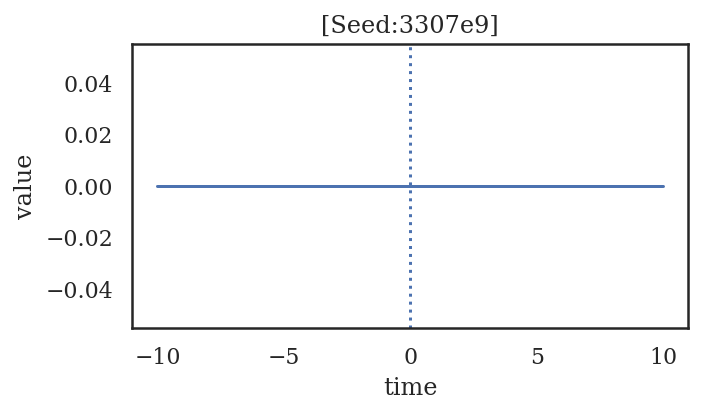

In [44]:
snip_df = tts_df.query("entered_search_mode == False")
# # snip_df = tts_df.query("entered_search_mode == True")
# snip_df = tts_df
# print( snip_df.shape )
# for i in range(snip_df.shape[0]):
#     plt.plot(snip_df['speed_snippet'].iloc[i])
# plt.show()

# Doesnt handle different sized speed_snippets (ie. end early)
# trajs = []
# for idx, row in snip_df.iterrows():
#     trajs.append(pd.DataFrame({
# #         'idx': idx,
#         'step': row['speed_snippet'],
#         'time': np.arange(-snippet_window, snippet_window+1, dtype=int).tolist(),
#      }))
# trajs = pd.concat(trajs)
# trajs

# Does handle different lengths
plt.figure(figsize=(5,3))
trajs = pd.DataFrame(snip_df['speed_snippet'].to_list())
trajs_melted = trajs.melt()
trajs
trajs_melted['time'] = trajs.shape[0] * np.arange(-snippet_window, snippet_window+1, dtype=int).tolist()
trajs_melted
# trajs_melted = trajs_melted.query("time > ")
sns.lineplot(data=trajs_melted, x='time', y='value', estimator=np.median, ci=68)
ax = plt.gca()
ax.axvline(x=0, ls=':')
plt.title(f"[Seed:{model_seed}]")
plt.tight_layout()
plt.savefig(f"{outdir}/tts_step_{model_seed}.png", dpi=dpi_save, bbox_inches='tight')
plt.show()


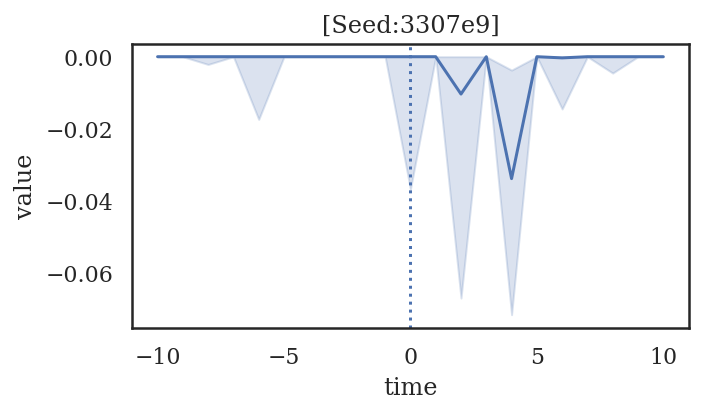

In [45]:
snip_df = ttc_df
# print( snip_df.shape )
# for i in range(snip_df.shape[0]):
#     plt.plot(snip_df['speed_snippet'].iloc[i])
# plt.show()

plt.figure(figsize=(5,3))
trajs = pd.DataFrame(snip_df['speed_snippet'].to_list())
trajs_melted = trajs.melt()
trajs
trajs_melted['time'] = trajs.shape[0] * np.arange(-snippet_window, snippet_window+1, dtype=int).tolist()
trajs_melted
# trajs_melted = trajs_melted.query("time > ")
sns.lineplot(data=trajs_melted, x='time', y='value', estimator=np.median, ci=68)
ax = plt.gca()
ax.axvline(x=0, ls=':')
plt.title(f"[Seed:{model_seed}]")
plt.tight_layout()
plt.savefig(f"{outdir}/ttc_step_{model_seed}.png", dpi=dpi_save, bbox_inches='tight')
plt.show()

## Limit Cycle Extraction

In [46]:
def get_period(ep_activity, search_start_idx=-50, max_period=50, plot=True):
    # Find finite-differences-period that is minimum
    diff_magnitudes = []
    for period in range(1, max_period):
        diff_trailing = pd.DataFrame(ep_activity[exit_idx:,:]).diff(periods=period).sum(axis=1)
        diff_trailing = diff_trailing.to_list()[search_start_idx:]
        diff_magnitudes.append( np.sum(np.abs(diff_trailing)) )
    period = np.argmin(diff_magnitudes) + 2
    
    if plot:
        pd.Series(diff_magnitudes).plot(figsize=(8,2))
        plt.axhline(y=0, c='grey', ls=':')
        plt.show()
    return period, diff_magnitudes

def get_lc_entry_idx(ep_activity, period, dist2lc_threshold=0.3):
    lc_activity = ep_activity[-period-2:,:]
    dist2lc = sp.spatial.distance.cdist(ep_activity, lc_activity)
    dist2lc = np.min(dist2lc, axis=1)
    dist2lc.shape

    pd.Series(dist2lc).plot(figsize=(8,2))
    plt.ylim(-0.5, 1)
    
    lc_entry_idx = np.argmax(dist2lc < dist2lc_threshold)
    plt.axhline(y=dist2lc_threshold, c='grey', ls=':')
    plt.axhline(y=0, c='grey', ls='-')
    plt.show()
    return lc_entry_idx

def plot_lc(pca_common, ep_activity, period, idx):
    fig = plt.figure(figsize=pca3d_figsize)
    ax = fig.gca(projection='3d')

    # Plot whole neural trajectory 
    X_pca = pca_common.transform(ep_activity)
    ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=1.0, c='grey', alpha=1.0)
    ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], c='black', marker='o', s=100) # Start
    ax.scatter(X_pca[-1, 0], X_pca[-1, 1], X_pca[-1, 2], c='black', marker='x', s=200) # End

    # Plot one
    LC_pca = pca_common.transform(ep_activity[-period:,:])
    ax.plot(LC_pca[:, 0], LC_pca[:, 1], LC_pca[:, 2], linewidth=2.0, c='red', alpha=1.0)

    # ax.plot(X_pca[exit_idx:lc_entry_idx, 0], 
    #         X_pca[exit_idx:lc_entry_idx, 1], 
    #         X_pca[exit_idx:lc_entry_idx, 2], 
    #         linewidth=1.0, c='blue', alpha=1.0)

    # ax.plot(X_pca[lc_entry_idx:, 0], X_pca[lc_entry_idx:, 1], X_pca[lc_entry_idx:, 2], linewidth=0.4, c='red', alpha=1.0)


    ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
    ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
    ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')

    plt.title(f'Idx:{idx} Period:{period} [Seed:{model_seed}]')
    plt.tight_layout()
    fname = f"{outdir}/limitcycle_{model_seed}_{idx}.png"
    print("Saving:", fname)
    plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')
    plt.show()

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


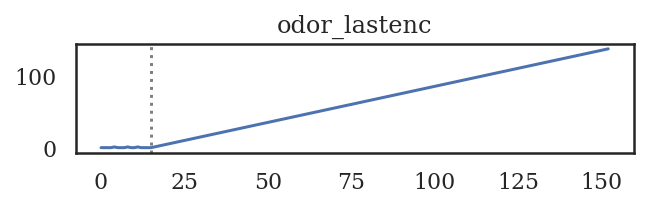

constantx5b5
Applying diffusion_multiplier 0.5


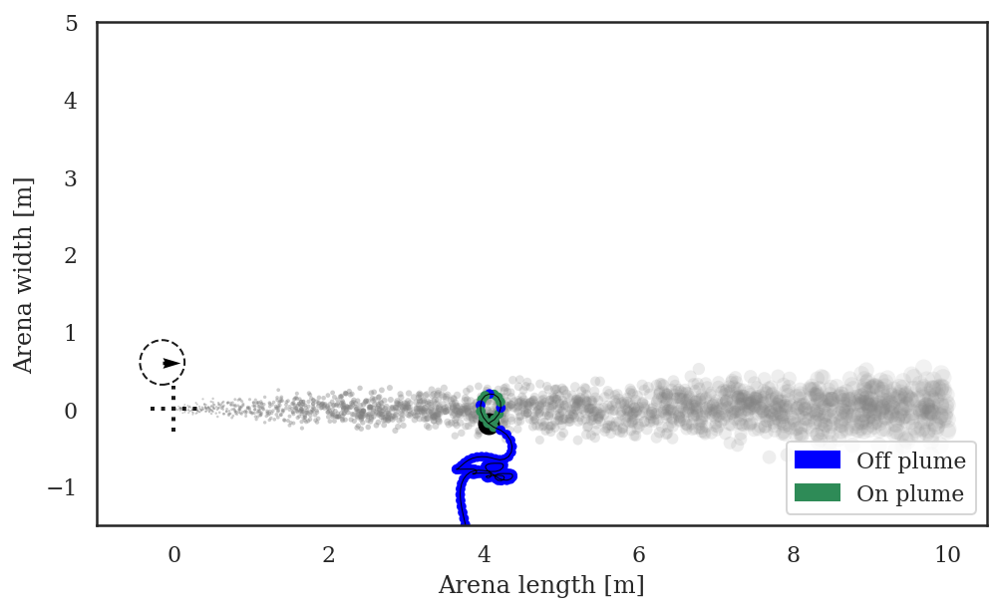

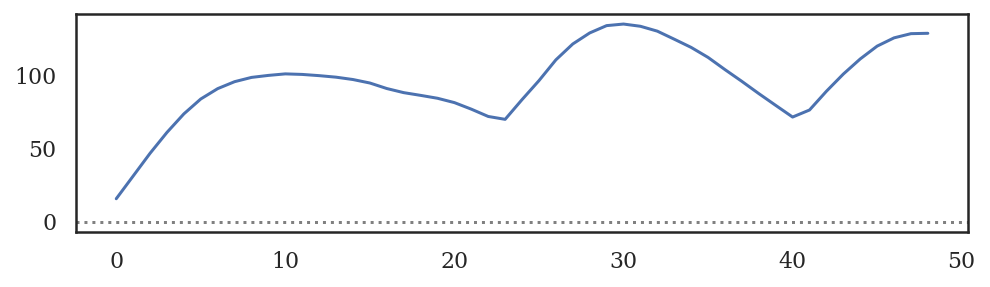

2 15.673670314252377 0


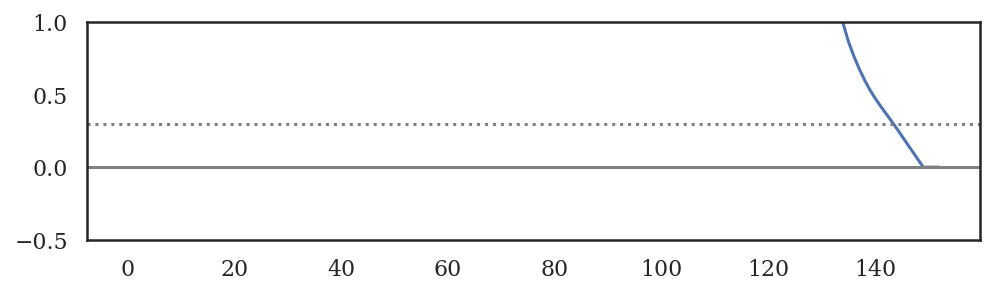

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_1.png


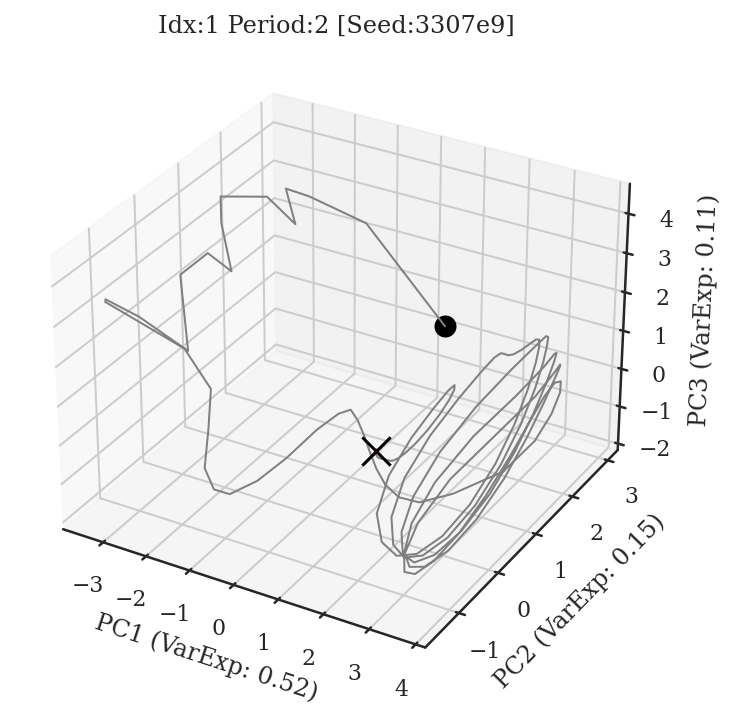

seed specific thresholds 12 35


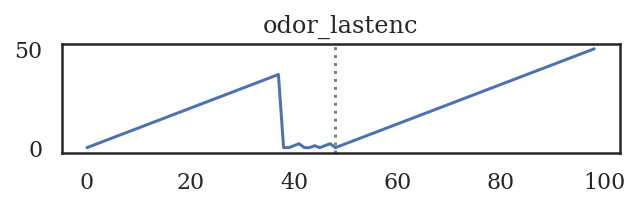

constantx5b5
Applying diffusion_multiplier 0.5


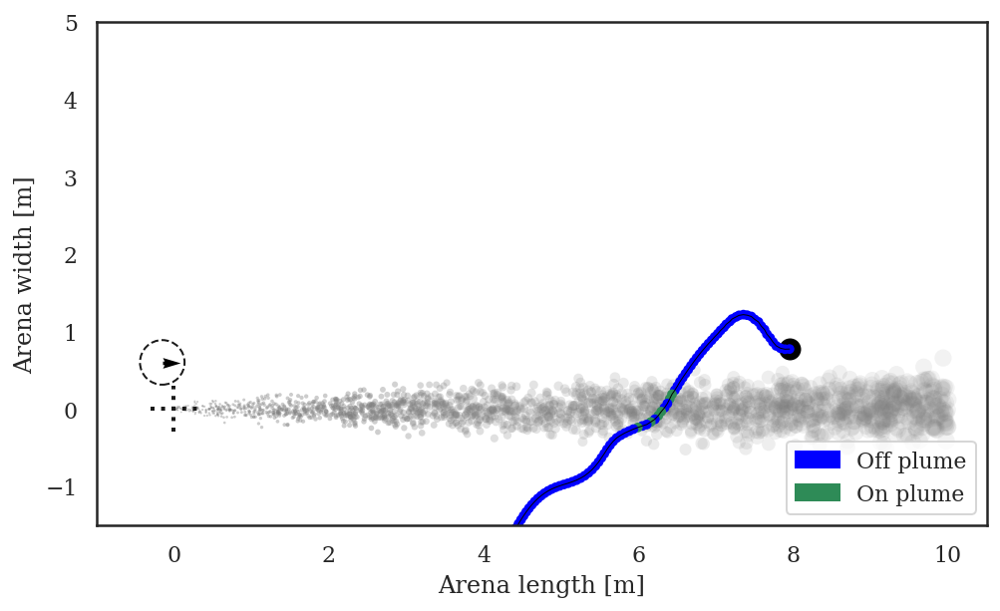

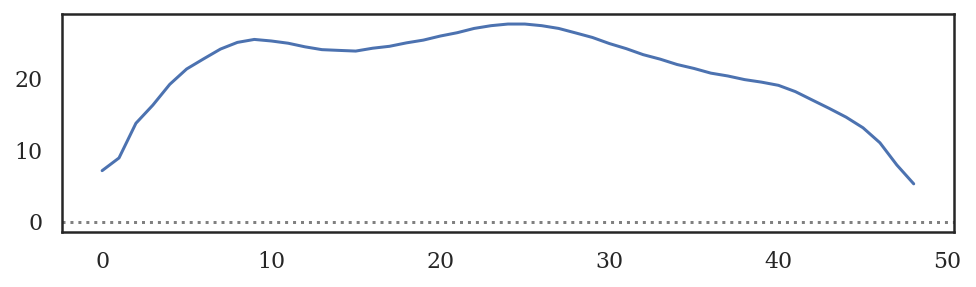

50 5.290449142456055 48


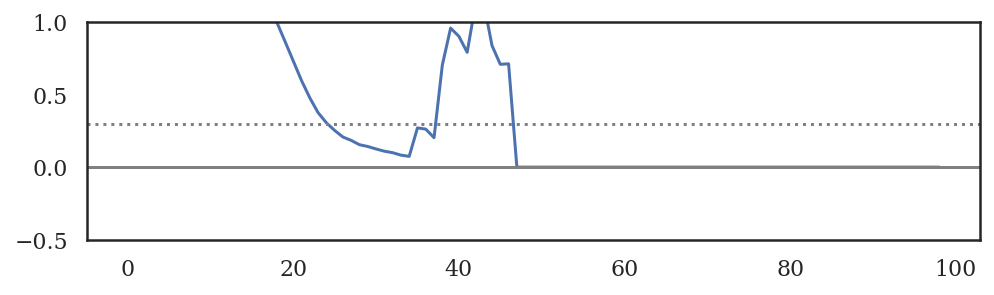

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_189.png


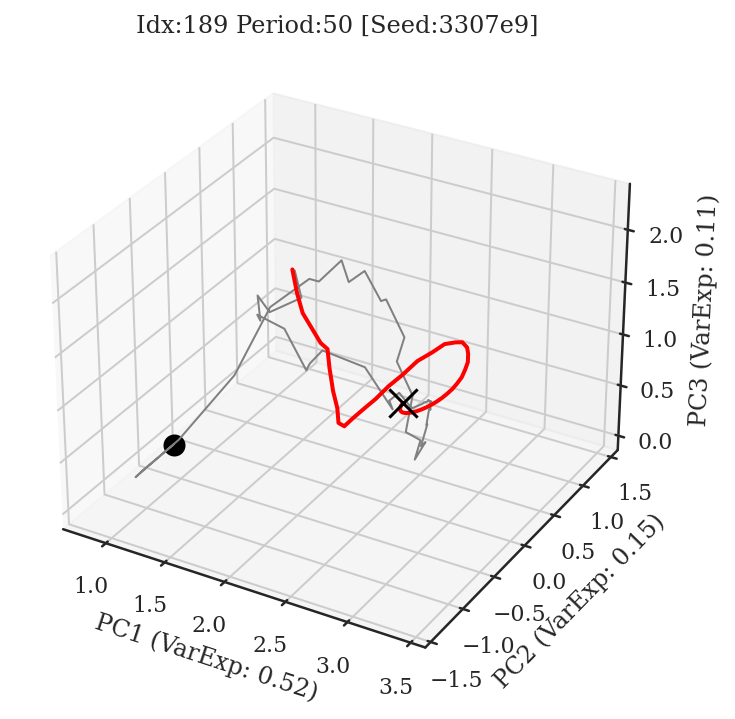

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


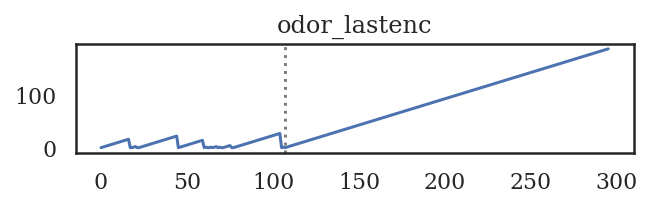

switch45x5b5
Applying diffusion_multiplier 0.5


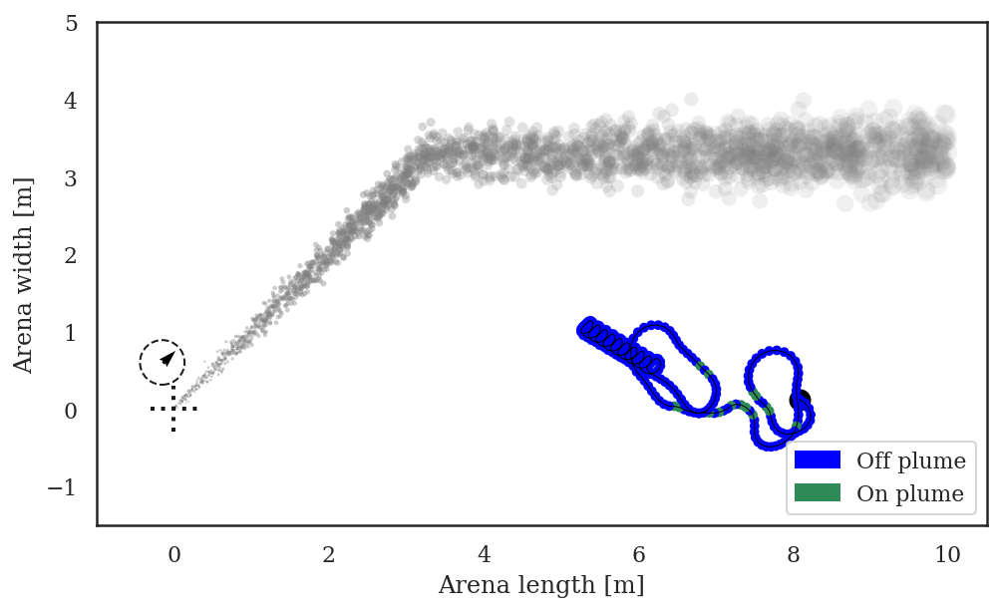

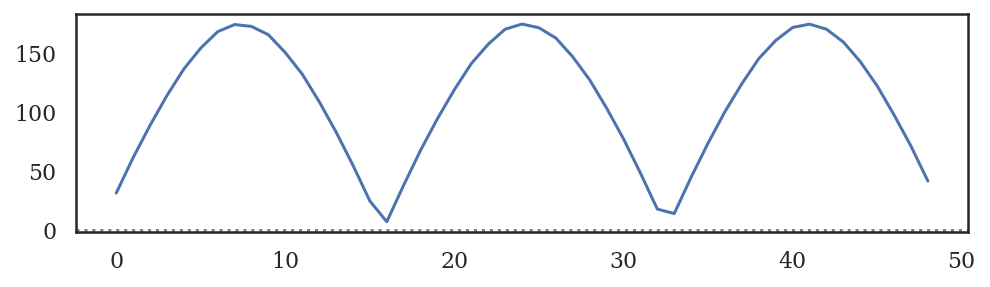

18 6.840531416237354 16


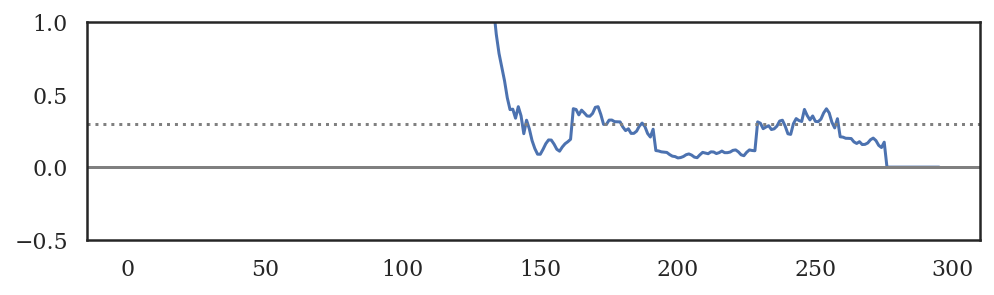

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_163.png


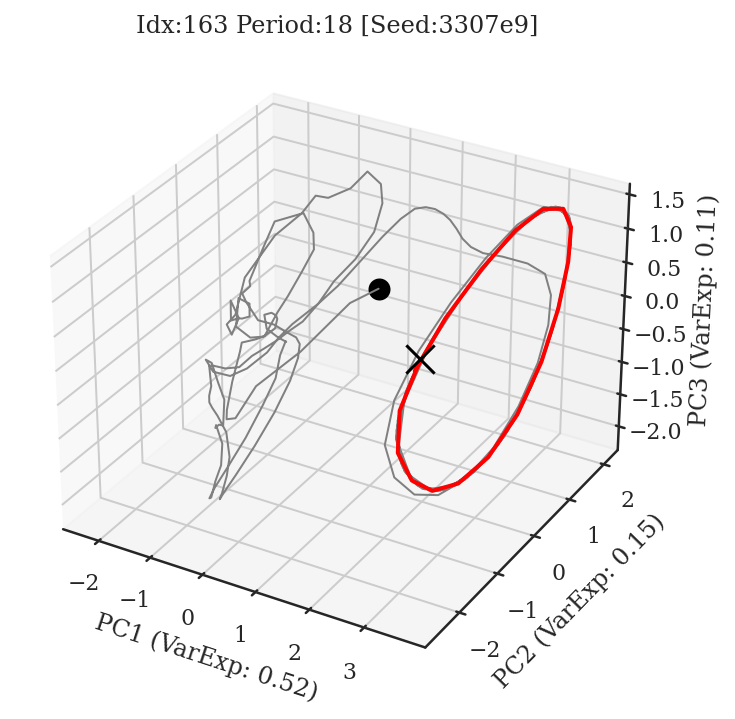

seed specific thresholds 12 35
seed specific thresholds 12 35


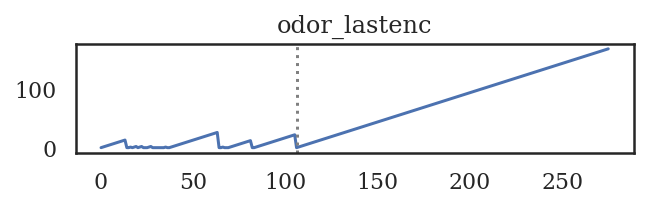

switch45x5b5
Applying diffusion_multiplier 0.5


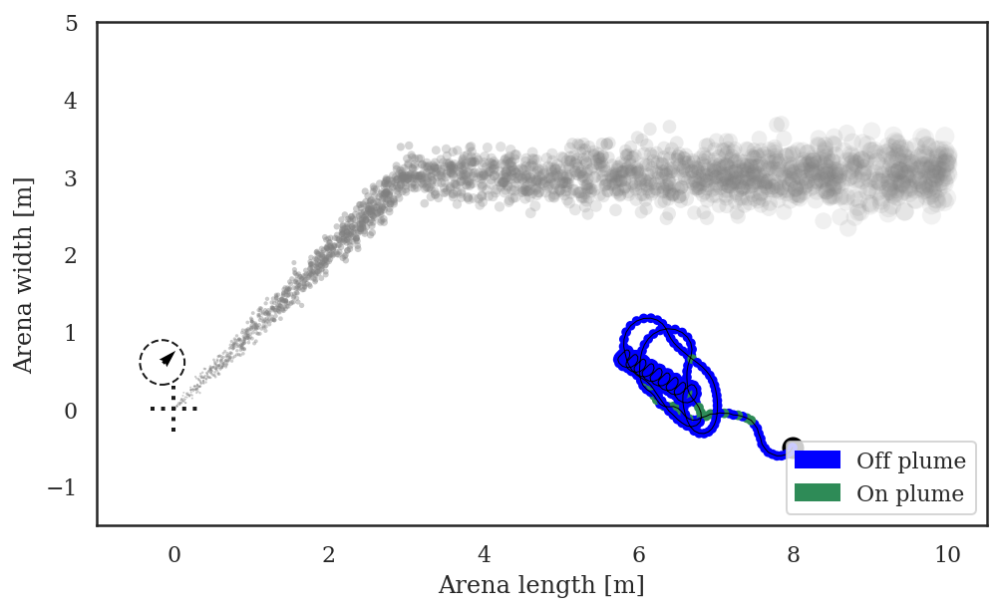

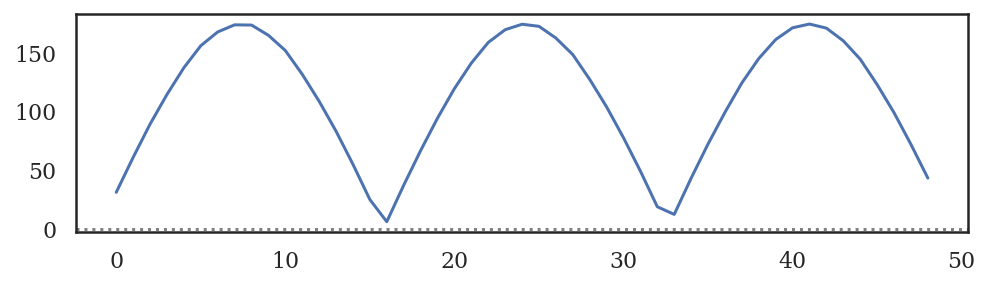

18 6.165015742182732 16


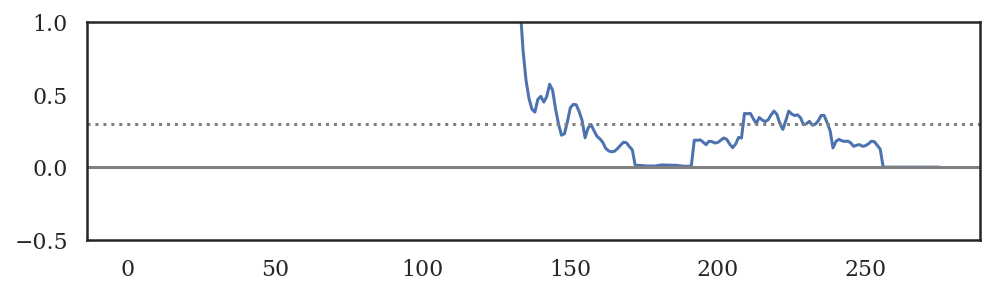

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_190.png


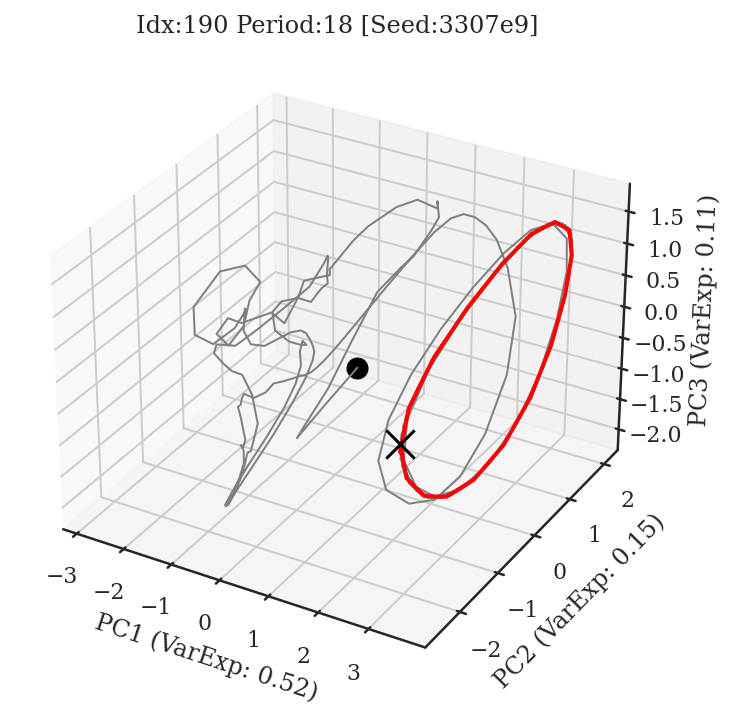

seed specific thresholds 12 35


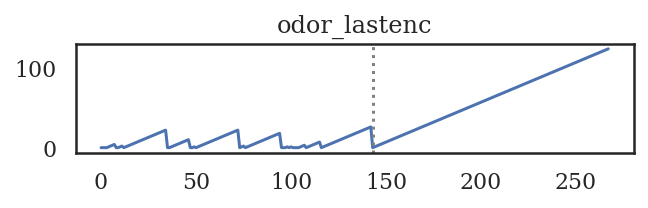

switch45x5b5
Applying diffusion_multiplier 0.5


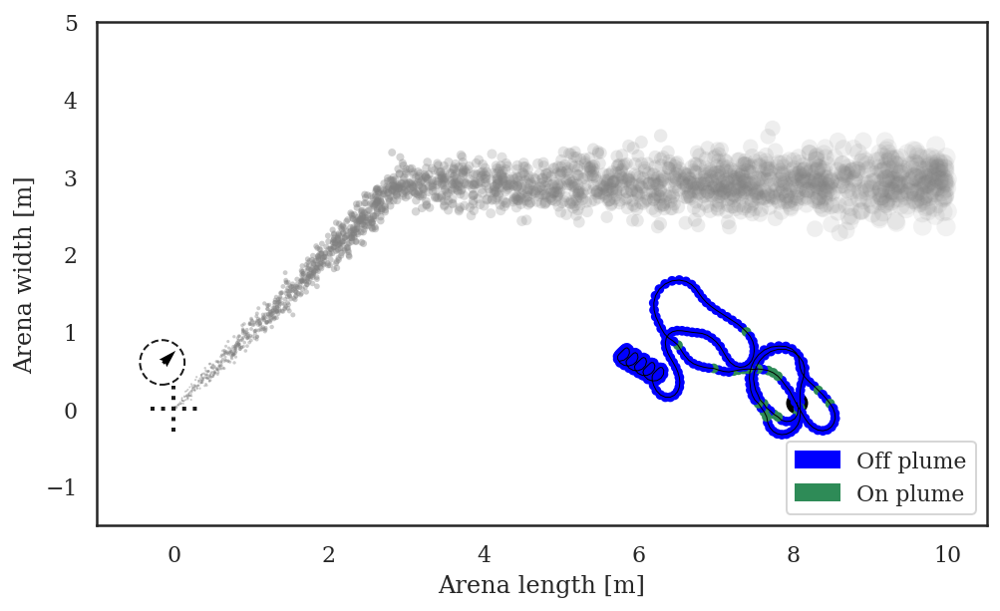

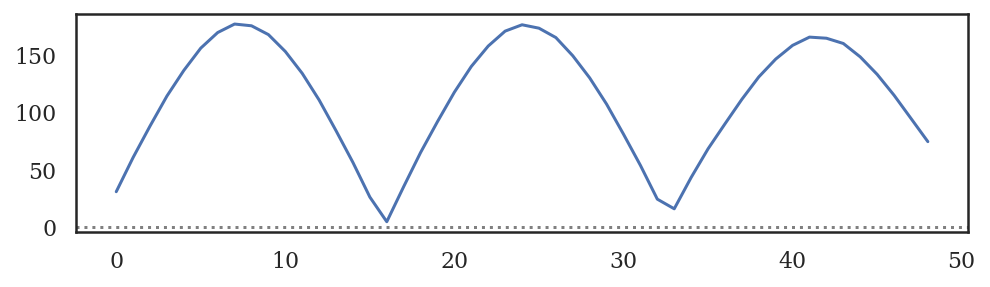

18 4.850865475833416 16


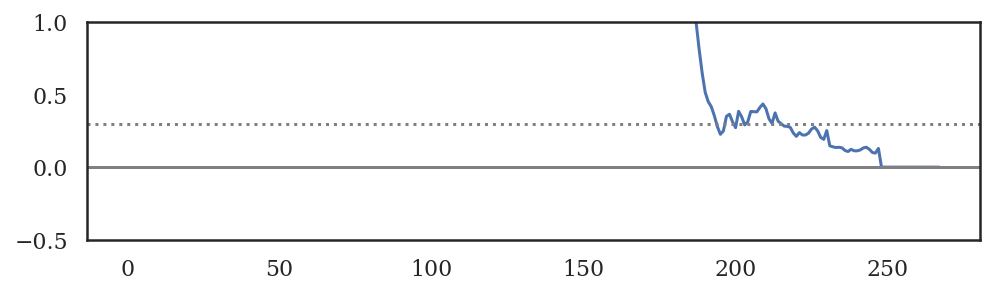

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_198.png


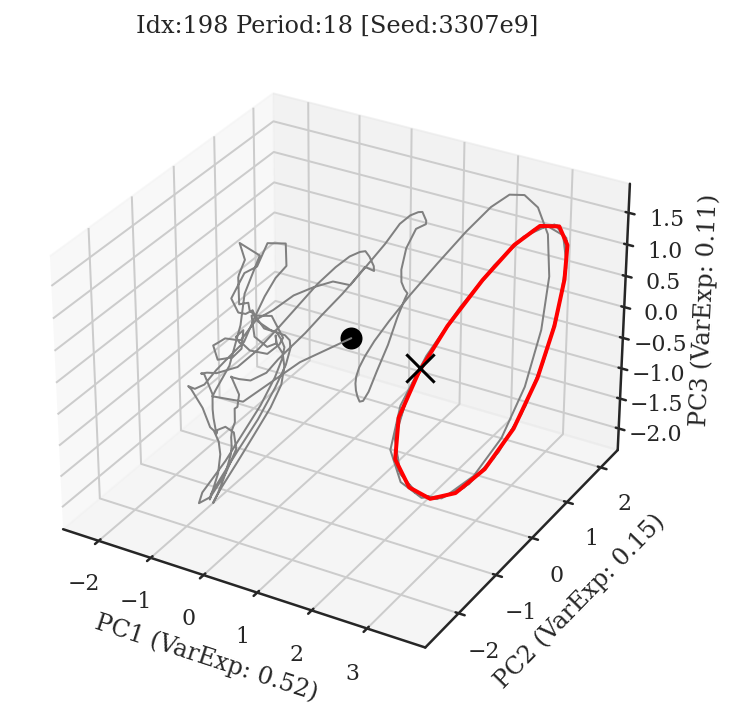

seed specific thresholds 12 35


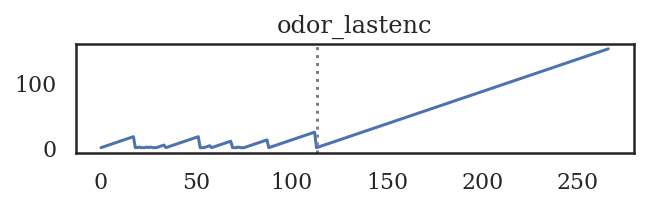

switch45x5b5
Applying diffusion_multiplier 0.5


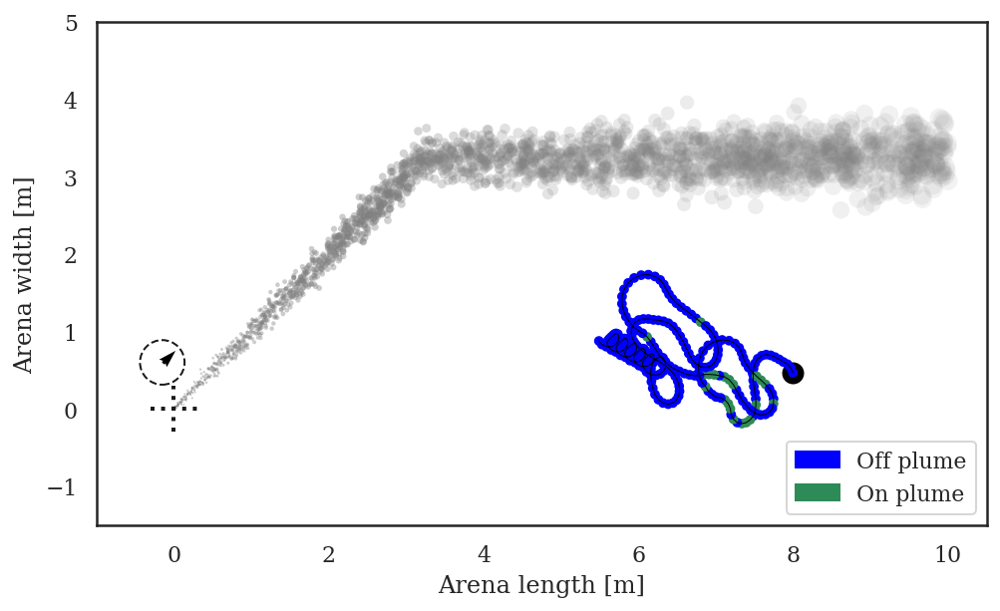

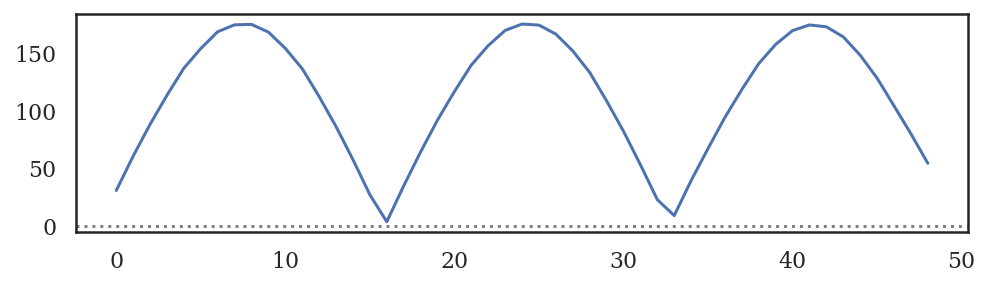

18 4.0529011860489845 16


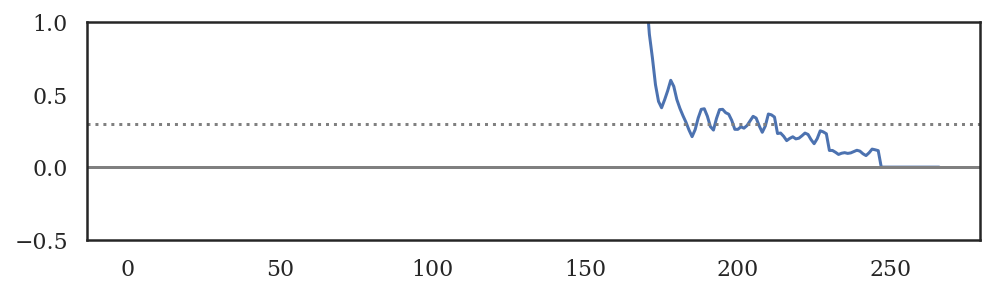

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_214.png


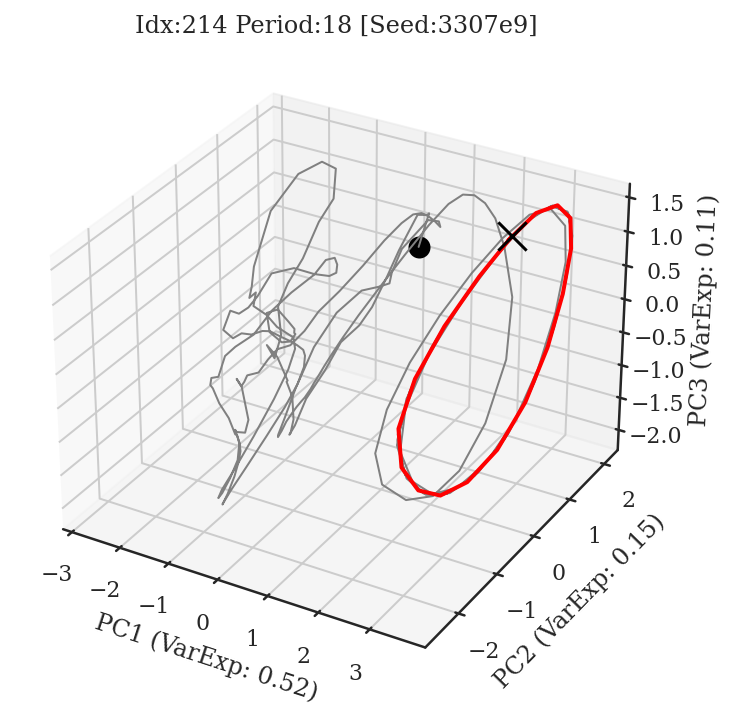

In [47]:
# Find episodes that end in casting (OOB)
# Find time from last_enc=0 to entry into OOB-centroid-range
# However, should have encountered plume for a few timesteps

outcome = 'OOB'
# datasets = ['constantx5b5']
datasets = ['constantx5b5', 'switch45x5b5']
num_to_plot = 5
# datasets = use_datasets
to_plot = []
# to_plot = ['distances']
# to_plot = ['distances', 'trajectories']
for idx, row in selected_df.query("outcome == @outcome and dataset in @datasets ").iterrows():
    outcome = row['outcome']
    ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
    traj_df = log_analysis.get_traj_df(row['log'], 
            extended_metadata=False, squash_action=False, seed=model_seed)
    
    if sum(traj_df.odor_lastenc == 0) > 5: # encountered plume at least 1/10th sec
        home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
        oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)

        exit_idx = len(traj_df.odor_01) - pd.Series(traj_df.odor_01).iloc[::-1].argmax()

        # when in OOB range
        oob_idx = pd.Series(oob_distances > centroid_ranges[outcome])
        oob_idx[:exit_idx] = True
        oob_idx = oob_idx.argmin()
        
        ep_len = traj_df.shape[0]
        if exit_idx > ep_len - 12: # Exclude trajectories where exits only at last 0.5s 
            continue
            
        ttc = oob_idx - exit_idx
        if ttc <= 0: # invalid
            continue

        pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1), title='odor_lastenc')
        plt.axvline(x=exit_idx, c='grey', ls=':')
        plt.show()
        
        agent_analysis.visualize_episodes([row['log']], 
                          zoom=2, 
                          dataset=row['dataset'],
                          animate=False,
                          diffusionx=diffusionx,
                         )
        plt.show()

        period, diff_magnitudes = get_period(ep_activity, search_start_idx=-50, max_period=50, plot=True)
        print(period, np.min(diff_magnitudes), np.argmin(diff_magnitudes))
        
        lc_entry_idx = get_lc_entry_idx(ep_activity, period, dist2lc_threshold=0.3)

        idx = row['idx']
        plot_lc(pca_common, ep_activity, period, idx)
        
        if num_to_plot <= 0:
            break
        else:
            num_to_plot -= 1



In [48]:
traj_df['odor_01'].value_counts()

0    245
1     22
Name: odor_01, dtype: int64

In [49]:
span = 3
pd.Series([0,0,0,1,1,1,0,0,0,0,1,1,0]).diff().clip(lower=0).ewm(span=span).mean()
# .apply(lambda x: 1 if x > 0 else 0)

0          NaN
1     0.000000
2     0.000000
3     0.571429
4     0.266667
5     0.129032
6     0.063492
7     0.031496
8     0.015686
9     0.007828
10    0.504399
11    0.252076
12    0.126007
dtype: float64

In [50]:
colorby = 'odor_ma_46'
'_'.join( colorby.split('_')[:-1] )

'odor_ma'